In [1]:
# import essential libraries
import pandas as pd
import numpy as np

# visuals
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# stats, model
import statsmodels.api as sm
import scipy.stats as stats

# import the datetime module
import datetime

# ignore warnings
import warnings
warnings.filterwarnings('ignore')

# prepare function
import prepare

# set format
pd.options.display.float_format = '{:.2f}'.format

***

# EDA - TIKTOK

#### Univariate Analysis (on entire dataset)
- Video Duration (What's the trending videos' duration?)
- Influencer's Follower Count
- Engagement Stats (likes, comments, views, shares)

#### Multivariate Analysis (train only)
- Duration vs. Category
- Duration vs. Engagement
- Engagement vs. Category
- Engagement vs. Influencer's Follower Count
- Engagement Over Time

In [13]:
tiktok = pd.read_csv('tiktok_data.csv')

In [14]:
tikotk = prepare.prep_tiktok(tiktok)

In [15]:
# trim off dates
tiktok = tiktok[tiktok.date >= '2018-12-01']
tiktok = tiktok[tiktok.date <= '2022-09-10']

# train dataset
train_size = int(round(tiktok.shape[0] * 0.5)+1)
train = tiktok[:train_size]
train = train.set_index('date')
train = train.sort_index()

In [10]:
tiktok.length.value_counts()

Medium: 15-60s        11058
Short: 0-15s           8847
Long: 1-3mins          1470
Extra-long: >3mins       54
Name: length, dtype: int64

## Univariate Analysis - Duration

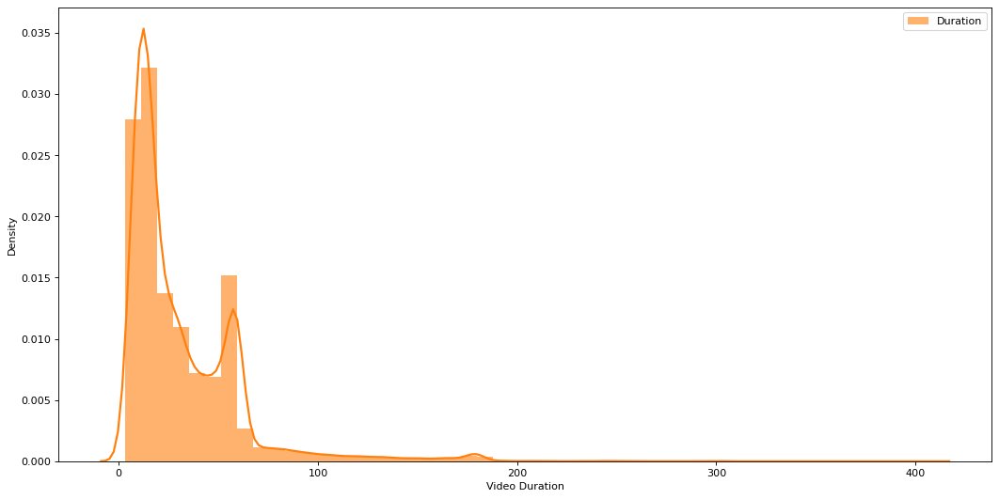

In [114]:
# duration distribution
kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
plt.figure(figsize=(16,8), dpi= 80)
sns.distplot(tiktok.duration, color="#ff800e", label="Duration", **kwargs)
plt.xlabel('Video Duration')
plt.ylabel('Density')
plt.legend();

### Tiktok Duraion Option
- 15s
- 30s
- 3m (180s)
- beyond 3m

#### Color Palette
'#133854', '#3c567f', #9d93d5','#6975ab', '#d7b1fa'

In [59]:
tiktok.length.value_counts()

Medium: 15-60s        11058
Short: 0-15s           8847
Long: 1-3mins          1470
Extra-long: >3mins       54
Name: length, dtype: int64

In [60]:
(11058+8847)/(11058+8847+1470+54)

0.9288814223715526

In [69]:
# visualizing duration distribution
fig = px.histogram(tiktok, x='length', title='TikTok Video Content Duration', template = "plotly_dark",
                   color='length', color_discrete_sequence=['#133854', '#9d93d5','#6975ab', '#edd2fe'],
                  labels={
                      'length':'Video Duration', 'count':'Amount of Videos'
                      
                  })
fig.update_xaxes(categoryorder='array', categoryarray=['Medium: 15-60s', 'Short: 0-15s', 'Long: 1-3mins', 'Extra-long: >3mins'])
fig.update_layout(paper_bgcolor="#202020", plot_bgcolor='#202020', font_color='#f3e2fe')
fig.show()

In [68]:
import plotly.figure_factory as ff
x = tiktok[tiktok.duration<200]['duration']
hist_data = [x]
group_labels = ['Video Duration'] # name of the dataset

fig = ff.create_distplot(hist_data, group_labels, colors = ['#f3e2fe'])
fig.update_layout(title_text='Video Duration (by second) Distribution', paper_bgcolor="#202020", plot_bgcolor='#202020', font_color = '#f3e2fe',font_size = 16, height=500)
fig.show()

#### <h3><div class="alert alert-info">NOTES: Most videos have a medium length (15s - 60s), second-most being short videos (<15s).</div></h3>

***

## Univariate Analysis - Influencer's Follower Size (To do: Plotly Displot)

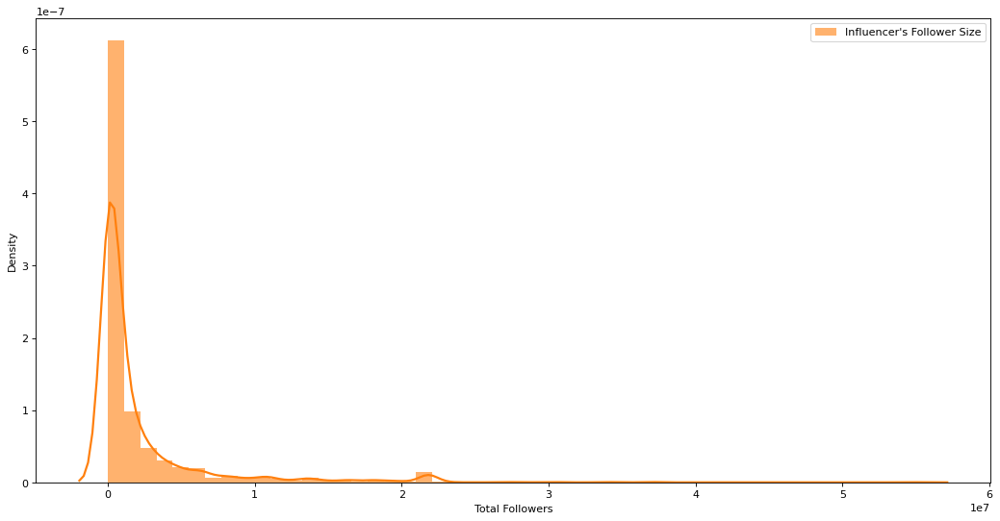

In [55]:
# duration distribution
kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
plt.figure(figsize=(16,8), dpi= 80)
sns.distplot(tiktok.total_followers, color="#ff800e", label="Influencer's Follower Size", **kwargs)
plt.xlabel('Total Followers')
plt.ylabel('Density')
plt.legend()

Text(0.5, 1.0, 'Influencer Follower Size Distribution')

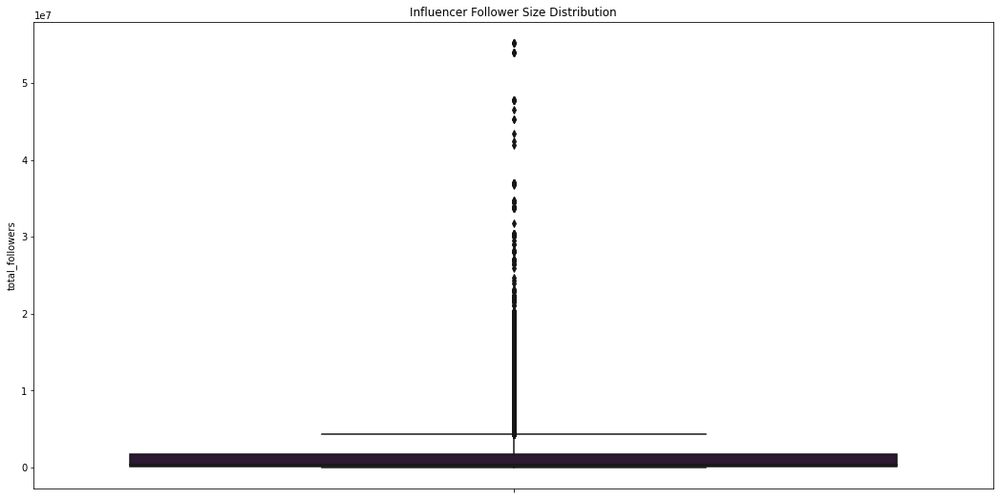

In [58]:
plt.figure(figsize = (18,9))
sns.boxplot(y=tiktok.total_followers, orient = 'v',palette = 'twilight')
plt.title('Influencer Follower Size Distribution')

In [60]:
tiktok.total_followers.describe()

count      21551.00
mean     2166892.40
std      4749789.89
min            0.00
25%        70300.00
50%       365300.00
75%      1800000.00
max     55200000.00
Name: total_followers, dtype: float64

***

## Univariate Analysis - Engagement

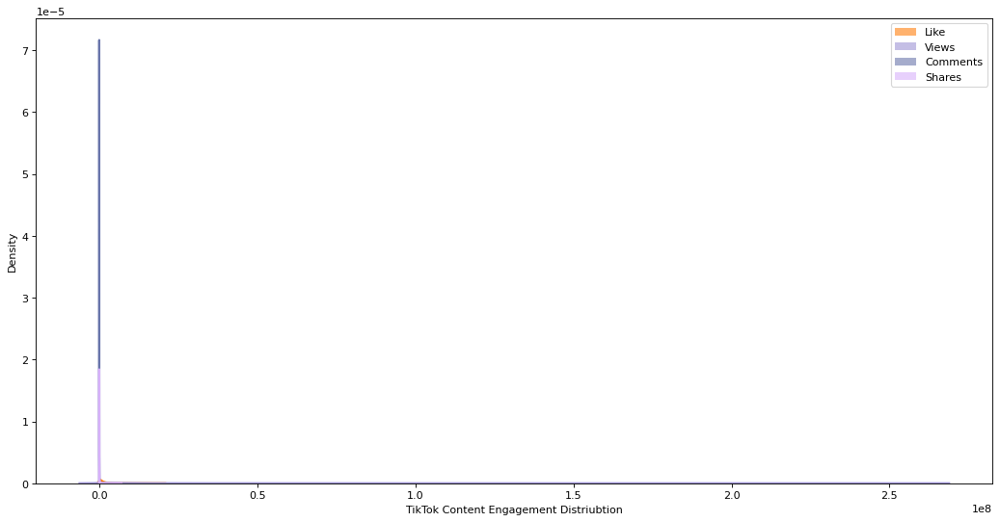

In [45]:
# duration distribution
kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
plt.figure(figsize=(16,8), dpi= 80)
sns.distplot(tiktok.likes, color="#ff800e", label="Like", **kwargs)
sns.distplot(tiktok.views, color="#9d93d5", label="Views", **kwargs)
sns.distplot(tiktok.comments, color="#6975ab", label="Comments", **kwargs)
sns.distplot(tiktok.shares, color="#d7b1fa", label="Shares", **kwargs)
plt.xlabel('TikTok Content Engagement Distriubtion')
plt.ylabel('Density')
plt.legend()

#### ▪️ Likes

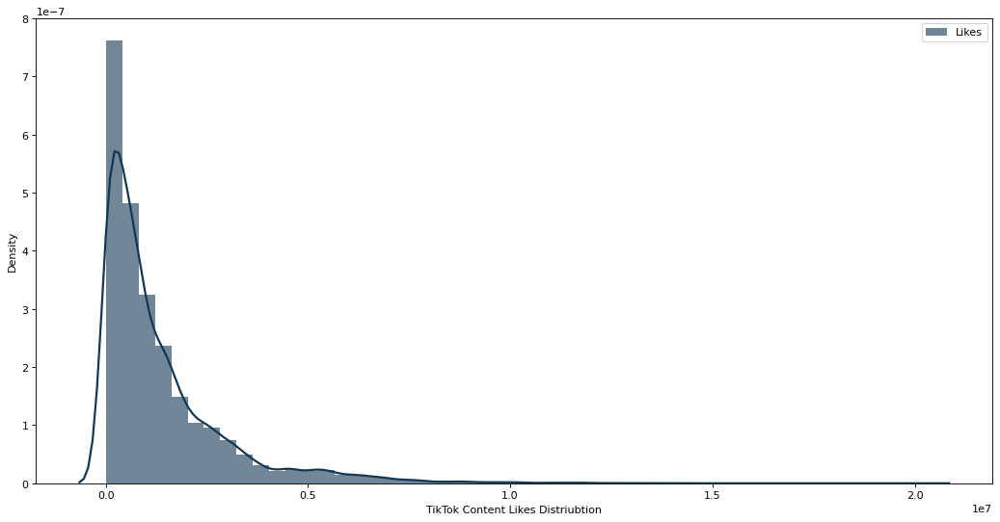

In [47]:
# likes distribution
kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
plt.figure(figsize=(16,8), dpi= 80)
sns.distplot(tiktok.likes, color="#133854", label="Likes", **kwargs)
plt.xlabel('TikTok Content Likes Distriubtion')
plt.ylabel('Density')
plt.legend()

#### ▪️ Views

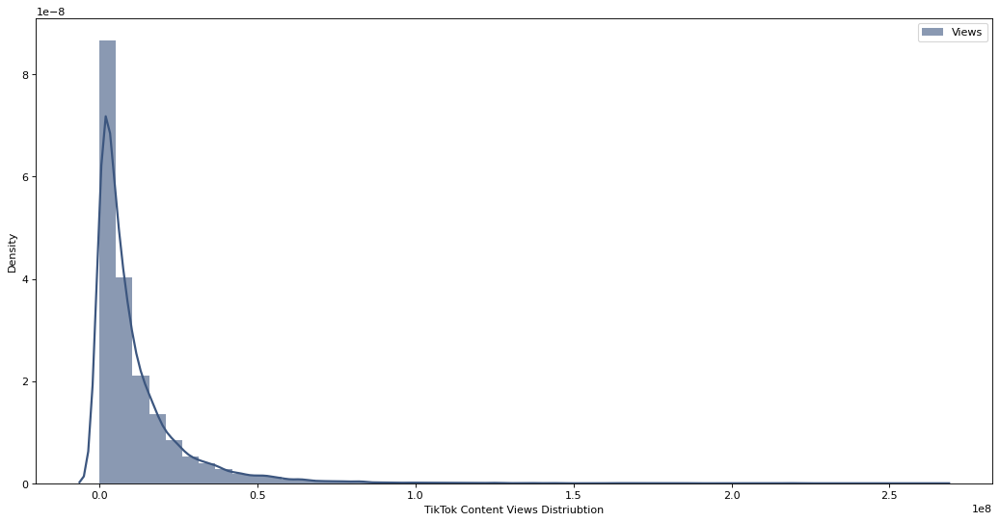

In [48]:
# views distribution
kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
plt.figure(figsize=(16,8), dpi= 80)
sns.distplot(tiktok.views, color="#6975ab", label="Views", **kwargs)
plt.xlabel('TikTok Content Views Distriubtion')
plt.ylabel('Density')
plt.legend()

#### ▪️Comments

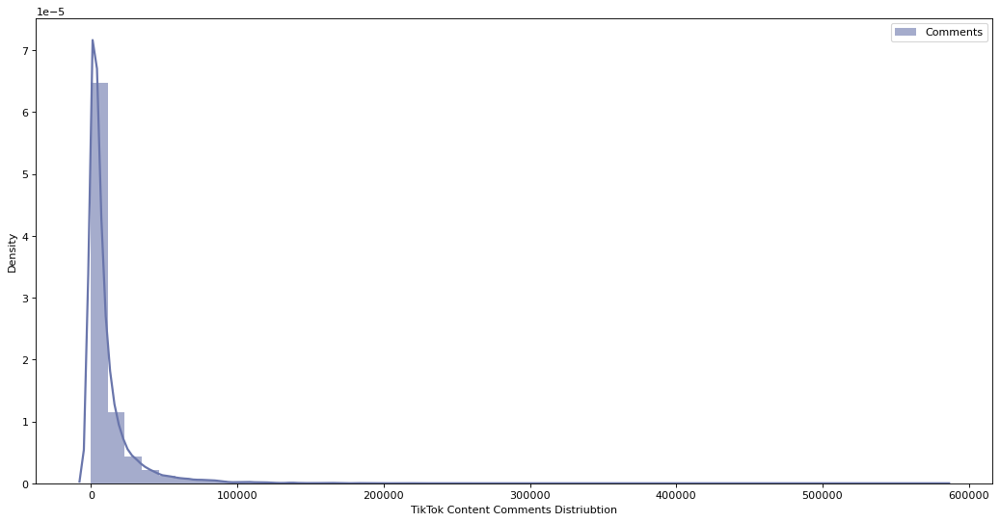

In [50]:
# comments distribution
kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
plt.figure(figsize=(16,8), dpi= 80)
sns.distplot(tiktok.comments, color="#6975ab", label="Comments", **kwargs)
plt.xlabel('TikTok Content Comments Distriubtion')
plt.ylabel('Density')
plt.legend()

#### ▪️ Shares

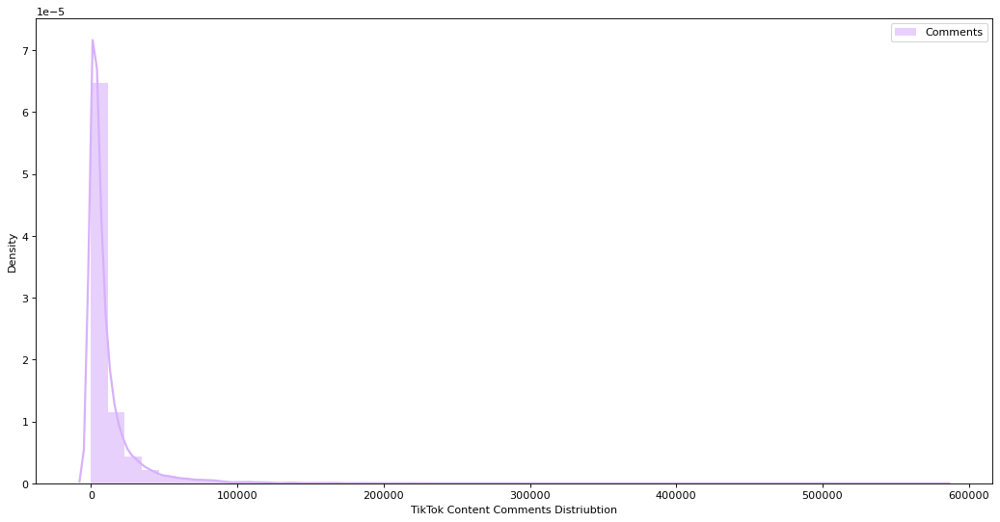

In [52]:
# shares distribution
kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
plt.figure(figsize=(16,8), dpi= 80)
sns.distplot(tiktok.comments, color="#d7b1fa", label="Comments", **kwargs)
plt.xlabel('TikTok Content Comments Distriubtion')
plt.ylabel('Density')
plt.legend()

In [7]:
tiktok.describe()

,comments,likes,views,shares,total_followers,total_likes,total_videos,duration
count,21429.00,21429.00,21429.00,21429.00,21429.00,21429.00,21429.00,21429.00
mean,10667.36,1352522.61,11237882.48,34476.74,2163051.24,74974046.78,709.95,31.37
std,19329.35,1601571.38,15332275.17,88576.69,4740042.62,202630669.48,1531.83,29.32
min,0.00,1620.00,4906.00,0.00,0.00,0.00,0.00,3.00
25%,1414.00,294300.00,2200000.00,2389.00,70600.00,2300000.00,119.00,12.00
50%,4499.00,805700.00,6100000.00,9584.00,366100.00,8800000.00,342.00,20.00
75%,11600.00,1800000.00,14200000.00,32400.00,1800000.00,46700000.00,819.00,45.00
max,578700.00,20200000.00,262600000.00,7000000.00,55200000.00,2900000000.00,51200.00,405.00


***

## Engagement vs. Category

#### ▪️ Likes

In [8]:
tiktok.likes.describe()

count      21551.00
mean     1348928.79
std      1600160.92
min         1620.00
25%       292400.00
50%       802300.00
75%      1800000.00
max     20200000.00
Name: likes, dtype: float64

<AxesSubplot:xlabel='category', ylabel='likes'>

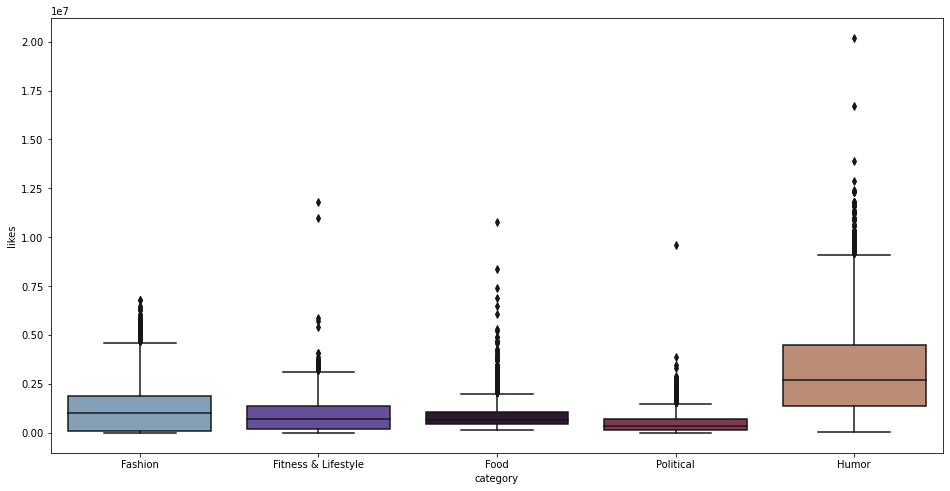

In [9]:
plt.figure(figsize = (16,8))
sns.boxplot(y=tiktok.likes, x= tiktok.category, orient = 'v',palette = 'twilight')

In [10]:
tiktok.groupby('category').likes.describe()

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
Fashion,4387.00,1228321.68,1212376.94,10100.00,90750.00,1000000.00,1900000.00,6800000.00
Fitness & Lifestyle,4059.00,913649.40,844451.89,13500.00,204050.00,717100.00,1400000.00,11800000.00
Food,4503.00,876808.19,654106.00,167900.00,460150.00,687300.00,1100000.00,10800000.00
Humor,4533.00,3095875.84,2313977.53,43700.00,1400000.00,2700000.00,4500000.00,20200000.00
Political,4069.00,489491.70,488259.27,1620.00,164200.00,360900.00,707300.00,9600000.00


#### ▪️ Views

In [11]:
tiktok.views.describe()

count       21551.00
mean     11209014.17
std      15314079.98
min          4906.00
25%       2100000.00
50%       6100000.00
75%      14200000.00
max     262600000.00
Name: views, dtype: float64

<AxesSubplot:xlabel='category', ylabel='views'>

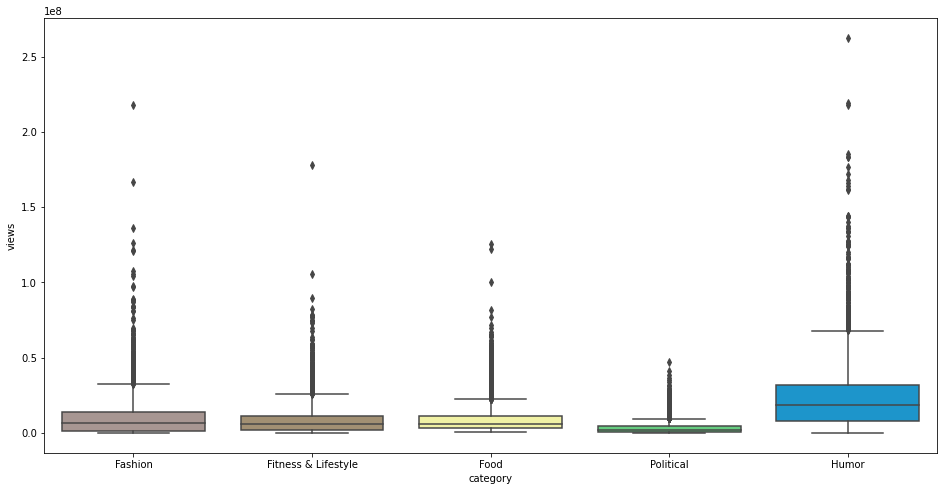

In [12]:
plt.figure(figsize = (16,8))
sns.boxplot(y=tiktok.views, x= tiktok.category, orient = 'v',palette = 'terrain_r')

In [32]:
tiktok.groupby('category').views.describe()

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
fashion,4387.00,9770807.02,12833742.53,35200.00,1100000.00,6400000.00,13700000.00,218100000.00
fitness & lifestyle,4059.00,8618078.20,10320949.36,27200.00,1900000.00,5700000.00,11500000.00,178100000.00
food,4503.00,9237421.21,9602552.65,571100.00,3600000.00,6100000.00,11100000.00,125300000.00
humor,4533.00,23891899.10,22940566.09,70100.00,8300000.00,18300000.00,32200000.00,262600000.00
political,4069.00,3396920.19,4081792.34,4906.00,867700.00,2200000.00,4400000.00,47000000.00


#### ▪️Comments


In [13]:
tiktok.comments.describe()

count    21551.00
mean     10632.57
std      19294.79
min          0.00
25%       1402.00
50%       4478.00
75%      11600.00
max     578700.00
Name: comments, dtype: float64

<AxesSubplot:xlabel='category', ylabel='comments'>

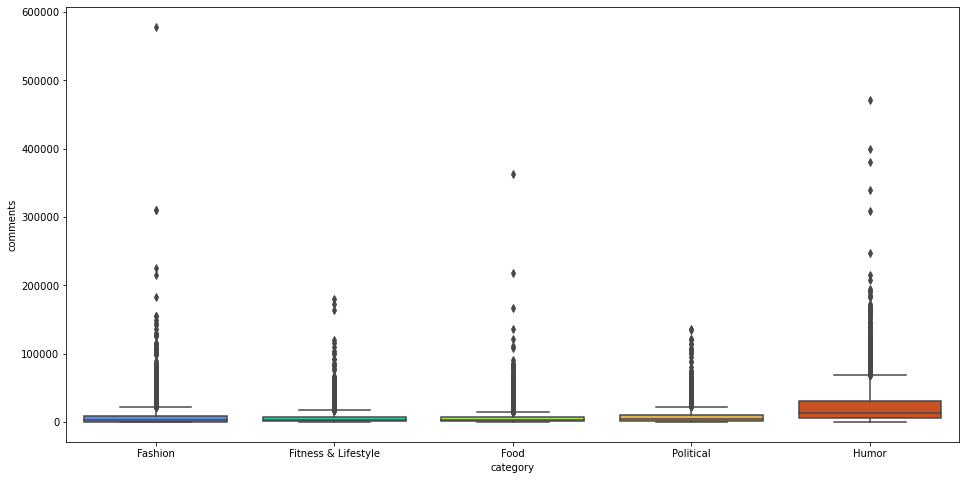

In [14]:
plt.figure(figsize = (16,8))
sns.boxplot(y=tiktok.comments, x= tiktok.category, orient = 'v',palette = 'turbo')

In [31]:
tiktok.groupby('category').comments.describe()

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
fashion,4387.00,8363.59,18744.48,0.00,513.50,2990.00,9230.00,578700.00
fitness & lifestyle,4059.00,6103.54,10564.55,0.00,830.00,2916.00,7291.00,180600.00
food,4503.00,6293.22,11362.04,0.00,1630.00,3299.00,6885.00,363300.00
humor,4533.00,23433.33,29420.58,0.00,5438.00,13800.00,30800.00,471200.00
political,4069.00,8138.50,11797.52,0.00,1492.00,4504.00,10000.00,136700.00


#### ▪️ Shares

In [104]:
tiktok.shares.describe()

count     21551.00
mean      34360.89
std       88387.40
min           0.00
25%        2371.50
50%        9527.00
75%       32300.00
max     7000000.00
Name: shares, dtype: float64

<AxesSubplot:xlabel='category', ylabel='shares'>

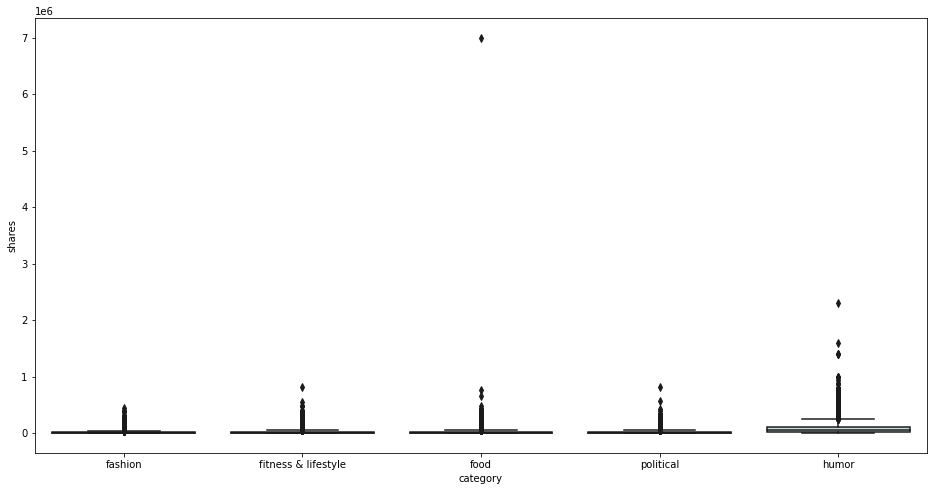

In [105]:
plt.figure(figsize = (16,8))
sns.boxplot(y=tiktok.shares, x= tiktok.category, orient = 'v',palette = 'bone')

In [30]:
tiktok.groupby('category').shares.describe()

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
fashion,4387.00,14520.56,30583.17,0.00,929.00,4072.00,14550.00,434400.00
fitness & lifestyle,4059.00,20283.06,41842.65,2.00,1840.00,6453.00,20350.00,812700.00
food,4503.00,24293.28,112071.39,61.00,2889.50,8703.00,25750.00,7000000.00
humor,4533.00,89858.32,130553.68,46.00,14000.00,45300.00,110900.00,2300000.00
political,4069.00,19110.46,36647.05,1.00,1550.00,7538.00,21400.00,817300.00


#### <h3><div class="alert alert-info">NOTES: Videos in humor category has significantly more engagement than other categories on average.</div></h3>

***

### Influencer's Stats vs. Category

In [96]:
tiktok[tiktok.category =='Fitness & Lifestyle'].describe()

,comments,likes,views,shares,total_followers,total_likes,total_videos,duration
count,4059.00,4059.00,4059.00,4059.00,4059.00,4059.00,4059.00,4059.00
mean,6103.54,913649.40,8618078.20,20283.06,1351021.25,38582080.96,678.67,25.51
std,10564.55,844451.89,10320949.36,41842.65,3628013.58,141318525.94,2450.85,24.18
min,0.00,13500.00,27200.00,2.00,229.00,19500.00,1.00,5.00
25%,830.00,204050.00,1900000.00,1840.00,62450.00,1700000.00,117.00,10.00
50%,2916.00,717100.00,5700000.00,6453.00,238700.00,5100000.00,310.00,15.00
75%,7291.00,1400000.00,11500000.00,20350.00,999850.00,19200000.00,686.50,33.00
max,180600.00,11800000.00,178100000.00,812700.00,54000000.00,2500000000.00,50600.00,211.00


In [94]:
followers = pd.DataFrame(tiktok.groupby('category')['total_followers'].mean())

In [16]:
followers['category'] = followers.index

In [17]:
followers

,total_followers,category
category,,
Fashion,1962099.60,Fashion
Fitness & Lifestyle,1351021.25,Fitness & Lifestyle
Food,3593645.38,Food
Humor,3059619.72,Humor
Political,628097.94,Political


In [19]:
fig = px.bar(followers, x='category', y='total_followers', title = "Influencer's Avg. Following Count per Category", template = "plotly_dark",
                   color='category', color_discrete_sequence=['#6975ab', '#9d93d5', '#133854', '#3c567f', '#d7b1fa'],
                  labels={
                      'total_followers': 'Follower Count',
                      'category': 'Category'
                      
                  })
fig.update_xaxes(categoryorder='array', categoryarray=['Food', 'Humor', 'Fashion', 'Fitness & Lifestyle', 'Political'])
fig.update_layout(paper_bgcolor="#202020", plot_bgcolor='#202020', font_color='#f3e2fe')
fig.show()

<AxesSubplot:xlabel='category', ylabel='total_followers'>

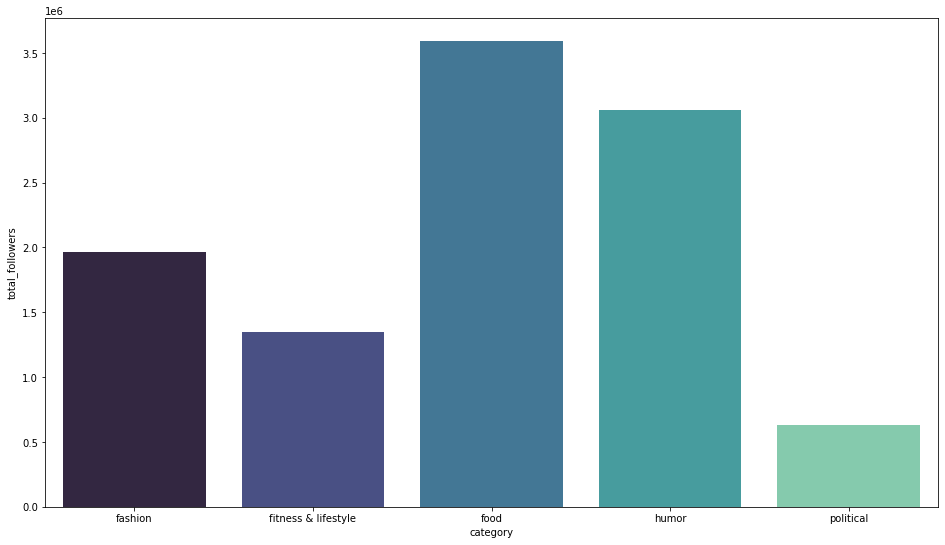

In [110]:
plt.figure(figsize = (16,9))
sns.barplot(x=followers.index, y='total_followers', data = followers, palette = 'mako')

## Duration vs. engagement score?

### <span style='background :orange' >Fashion</span>

#### ▪️ <span style="color: blue"><b>Likes</b></span>

<AxesSubplot:xlabel='duration', ylabel='likes'>

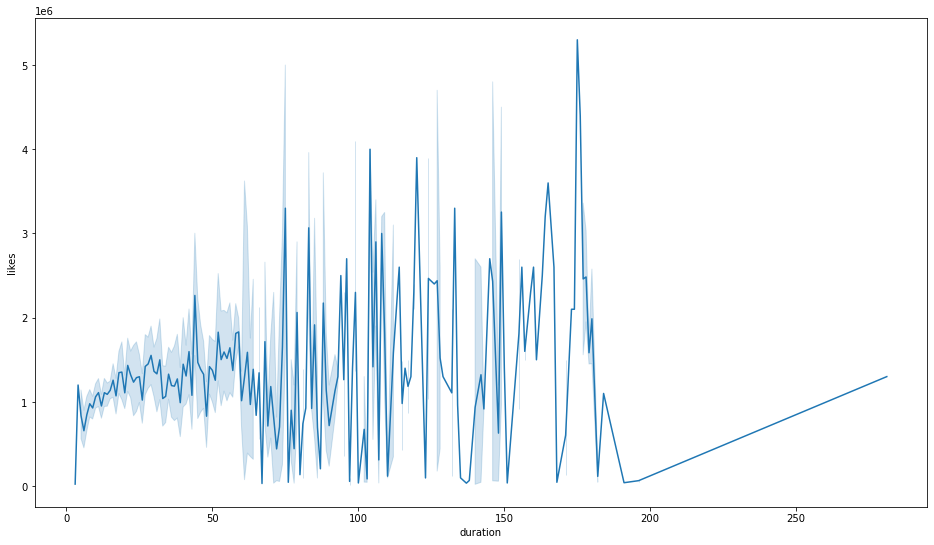

In [20]:
# visualizing duration and like count
plt.figure(figsize = (16,9))
sns.lineplot(x=tiktok[tiktok['category']=='Fashion'].duration, y=tiktok[tiktok['category']=='Fashion'].likes)

 <span style="color: blue"><b>We see a small spike in 0-7 seconds videos, 10-30 videos are relatviely stable (positive correlation betwen duration and likes)</b></span>

#### Hypothesis Testing
Ho = duration does not correlate with like counts

Ha = duration does correlate with like counts


In [21]:
x = tiktok[tiktok['category']=='Fashion'].duration
y = y=tiktok[tiktok['category']=='Fashion'].likes
r,p = stats.pearsonr(x, y)

print('p=', p)
print('r=', r)

p= 9.577518440447978e-26
r= 0.15743684106874165


#### <h3><div class="alert alert-info">NOTES: Fashion like counts has very weak positive correlation with video duration</div></h3>

#### <span style="color: blue"><b>▪️ Views</b></span>

<AxesSubplot:xlabel='duration', ylabel='views'>

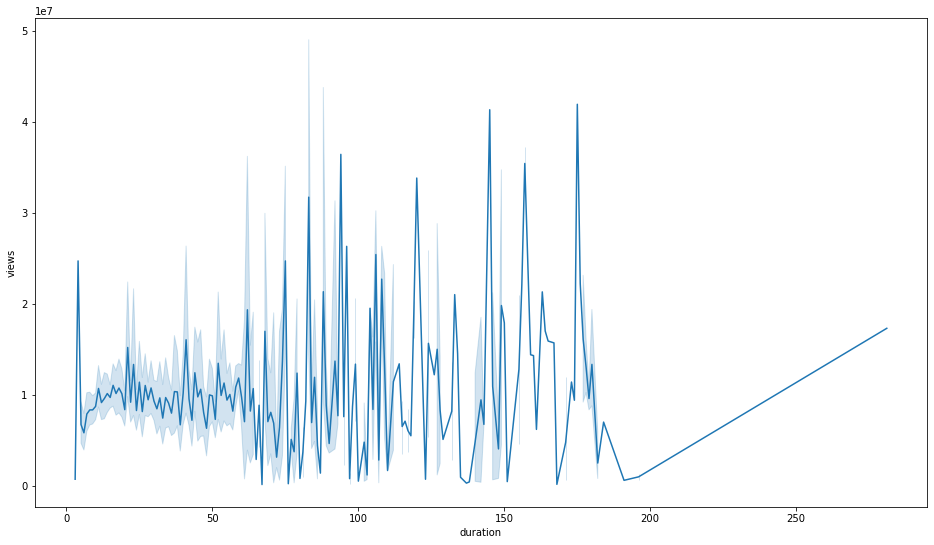

In [22]:
# visualizing duration and view count
plt.figure(figsize = (16,9))
sns.lineplot(x=tiktok[tiktok['category']=='Fashion'].duration, y=tiktok[tiktok['category']=='Fashion'].views)

#### Hypothesis Testing
Ho = duration does not correlate with view counts

Ha = duration does correlate with view counts


In [23]:
x = tiktok[tiktok['category']=='Fashion'].duration
y = tiktok[tiktok['category']=='Fashion'].views
r,p = stats.pearsonr(x, y)

print('p=', p)
print('r=', r)

p= 0.0009027112024105901
r= 0.050095935220312374


#### <h3><div class="alert alert-info">NOTES: Fashion view counts doesn't have correlation with video duration</div></h3>

<AxesSubplot:xlabel='duration', ylabel='views'>

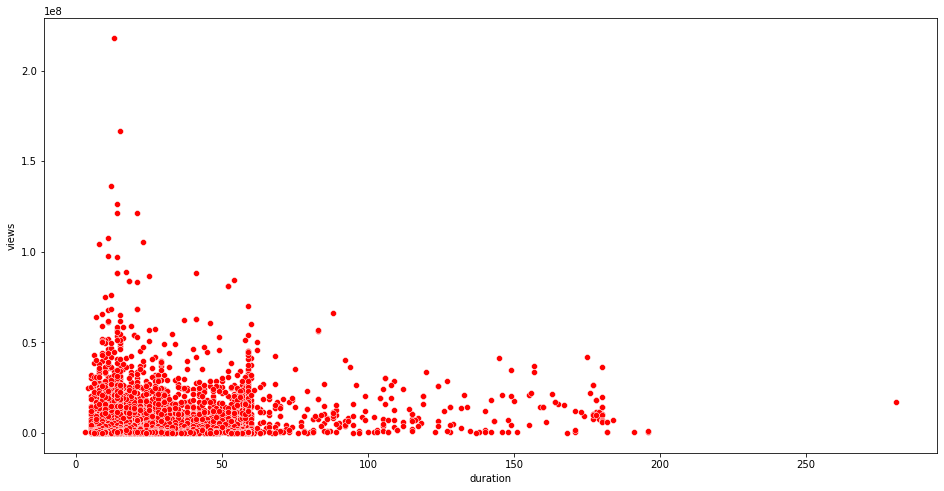

In [24]:
# visualizing duration distribution
plt.figure(figsize = (16,8))
sns.scatterplot(x=tiktok[tiktok['category']=='Fashion'].duration, y=tiktok[tiktok['category']=='Fashion'].views, color = 'red')

In [80]:
# stats of fashion content duration
tiktok[tiktok['category']=='fashion'].duration.describe()

count   4399.00
mean      28.95
std       28.36
min        0.00
25%       12.00
50%       17.00
75%       39.00
max      281.00
Name: duration, dtype: float64

#### <span style="color: blue"><b>▪️ Comments</b></span>

<AxesSubplot:xlabel='duration', ylabel='comments'>

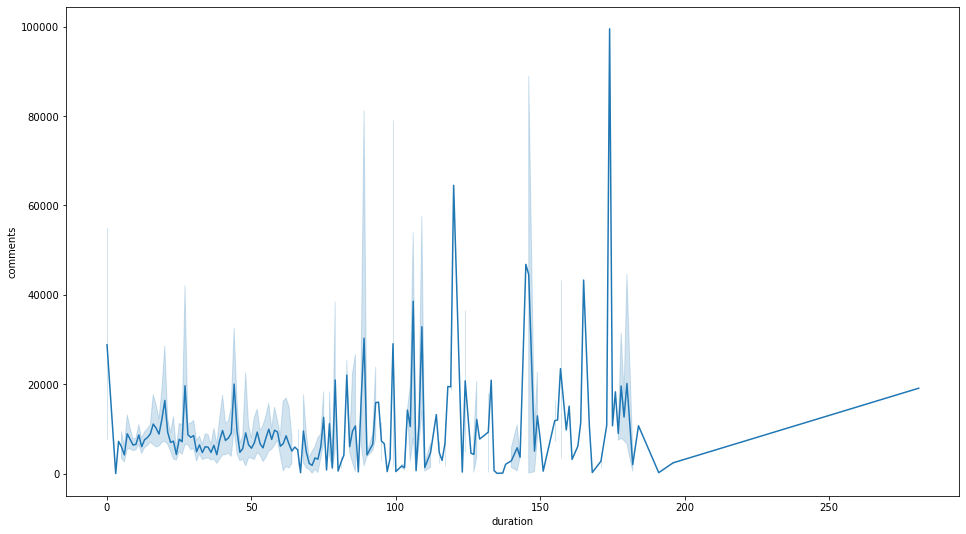

In [81]:
# visualizing duration and comments count
plt.figure(figsize = (16,9))
sns.lineplot(x=tiktok[tiktok['category']=='Fashion'].duration, y=tiktok[tiktok['category']=='Fashion'].comments)

#### Hypothesis Testing
Ho = duration does not correlate with comment counts

Ha = duration does correlate with comment counts


In [82]:
x = tiktok[tiktok['category']=='Fashion'].duration
y = tiktok[tiktok['category']=='Ffashion'].comments
r,p = stats.pearsonr(x, y)

print('p=', p)
print('r=', r)

p= 0.0037921967249732215
r= 0.04363957353949474


#### <h3><div class="alert alert-info">NOTES: Fashion comment counts doesn't have correlation with video duration</div></h3>

#### <span style="color: blue"><b>▪️ Shares</b></span>

<AxesSubplot:xlabel='duration', ylabel='shares'>

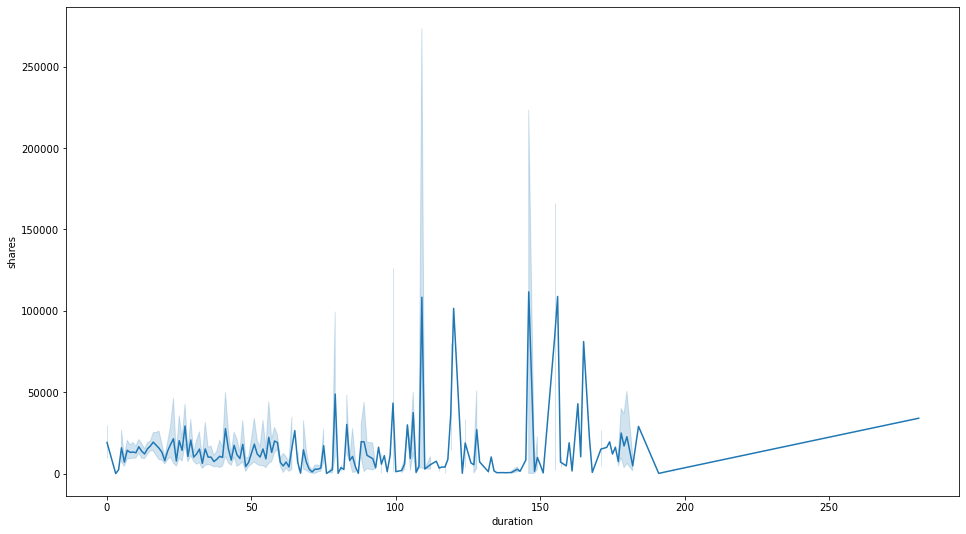

In [83]:
# visualizing duration and shares count
plt.figure(figsize = (16,9))
sns.lineplot(x=tiktok[tiktok['category']=='Fashion'].duration, y=tiktok[tiktok['category']=='Fashion'].shares)

#### Hypothesis Testing
Ho = duration does not correlate with share counts

Ha = duration does correlate with share counts


In [84]:
x = tiktok[tiktok['category']=='Fashion'].duration
y = tiktok[tiktok['category']=='Fashion'].shares
r,p = stats.pearsonr(x, y)

print('p=', p)
print('r=', r)

p= 0.17797310308467262
r= 0.020313108323843962


#### <h3><div class="alert alert-info">NOTES: Fashion share counts doesn't have correlation with video duration</div></h3>

### <span style='background :orange' >Humor</span>

#### ▪️ <span style="color: blue"><b>Likes</b></span>

<AxesSubplot:xlabel='duration', ylabel='likes'>

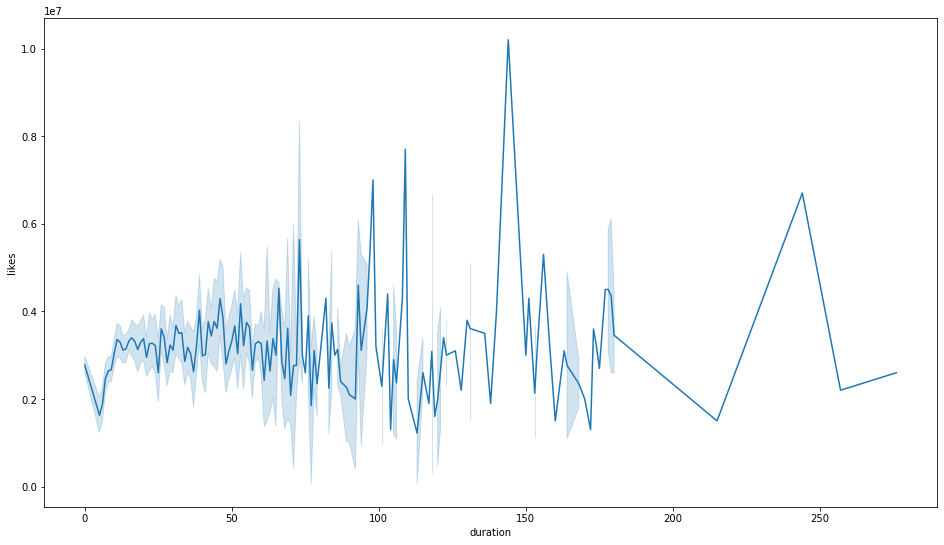

In [85]:
# visualizing duration and like count
plt.figure(figsize = (16,9))
sns.lineplot(x=tiktok[tiktok['category']=='Humor'].duration, y=tiktok[tiktok['category']=='Humor'].likes)

#### <span style="color: blue"><b>▪️ Views</b></span>

<AxesSubplot:xlabel='duration', ylabel='views'>

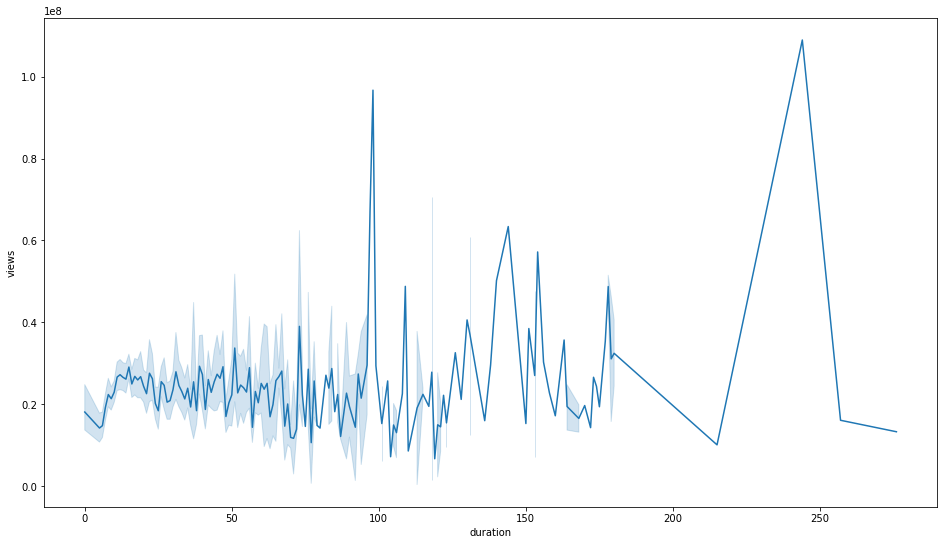

In [86]:
# visualizing duration and view count
plt.figure(figsize = (16,9))
sns.lineplot(x=tiktok[tiktok['category']=='Humor'].duration, y=tiktok[tiktok['category']=='Humor'].views)

#### <span style="color: blue"><b>▪️ Comments</b></span>

<AxesSubplot:xlabel='duration', ylabel='comments'>

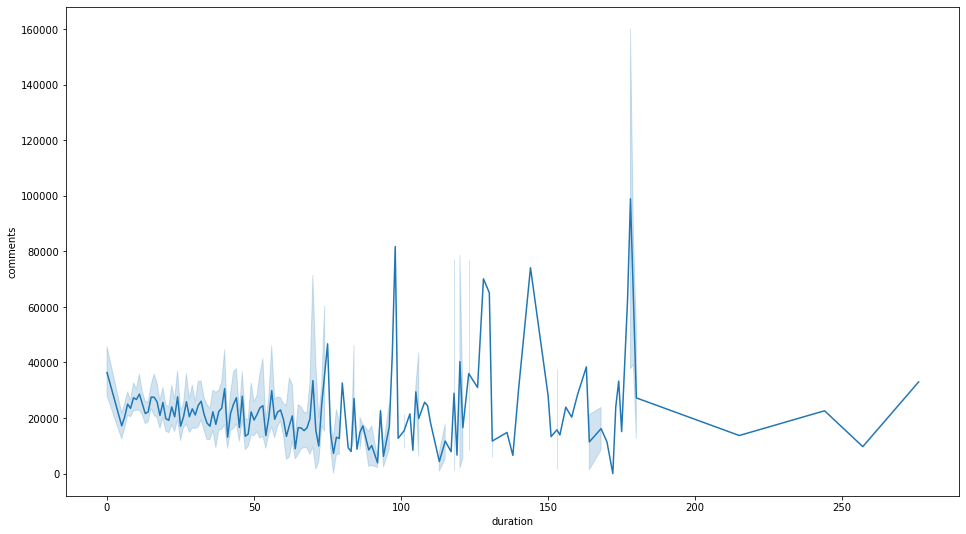

In [87]:
# visualizing duration and comment count
plt.figure(figsize = (16,9))
sns.lineplot(x=tiktok[tiktok['category']=='Humor'].duration, y=tiktok[tiktok['category']=='Humor'].comments)

#### <span style="color: blue"><b>▪️ Shares</b></span>

<AxesSubplot:xlabel='duration', ylabel='shares'>

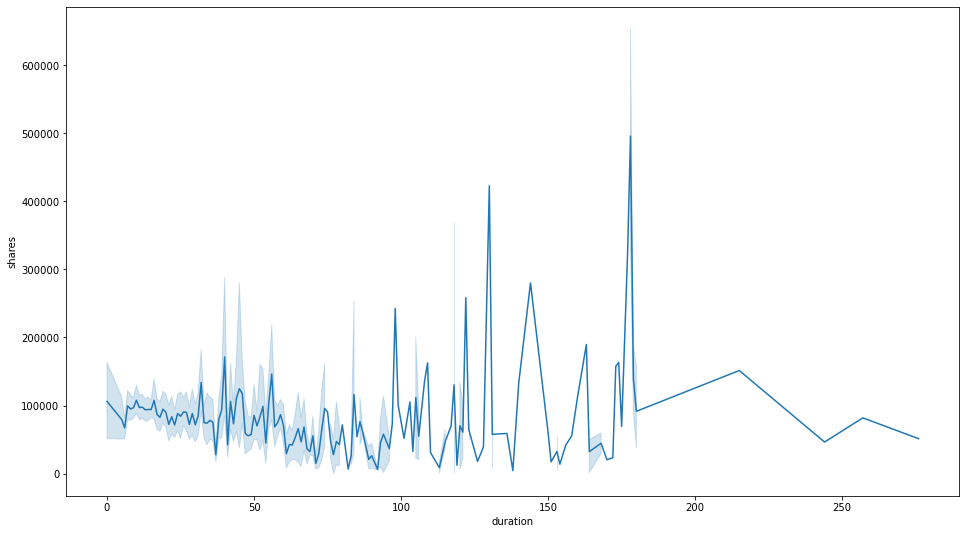

In [88]:
# visualizing duration and like count
plt.figure(figsize = (16,9))
sns.lineplot(x=tiktok[tiktok['category']=='Humor'].duration, y=tiktok[tiktok['category']=='Humor'].shares)

### <span style='background :orange' >Fitness & Lifestyle</span>

#### ▪️ <span style="color: blue"><b>Likes</b></span>

<AxesSubplot:xlabel='duration', ylabel='likes'>

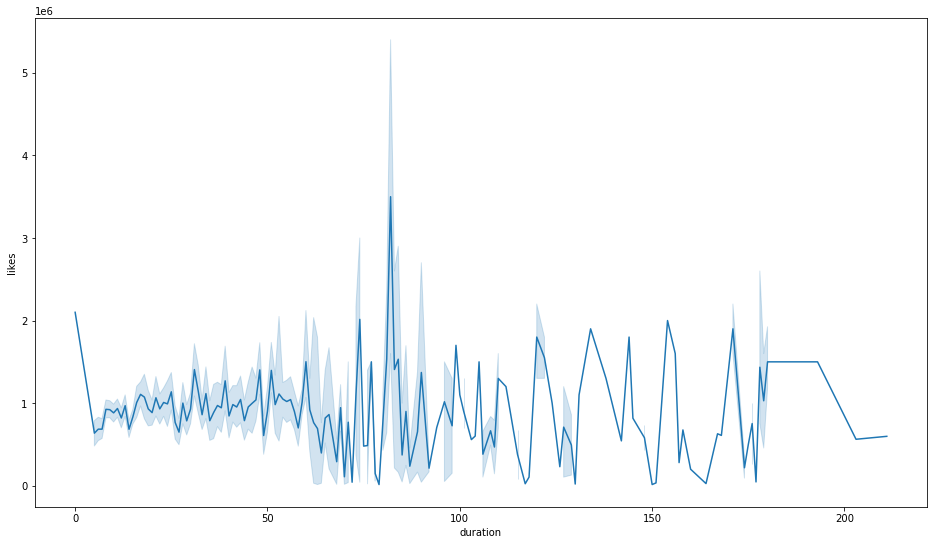

In [90]:
# visualizing duration and like count
plt.figure(figsize = (16,9))
sns.lineplot(x=tiktok[tiktok['category']=='Fitness & Lifestyle'].duration, y=tiktok[tiktok['category']=='Fitness & Lifestyle'].likes)

#### ▪️ <span style="color: blue"><b>Views</b></span>

<AxesSubplot:xlabel='duration', ylabel='views'>

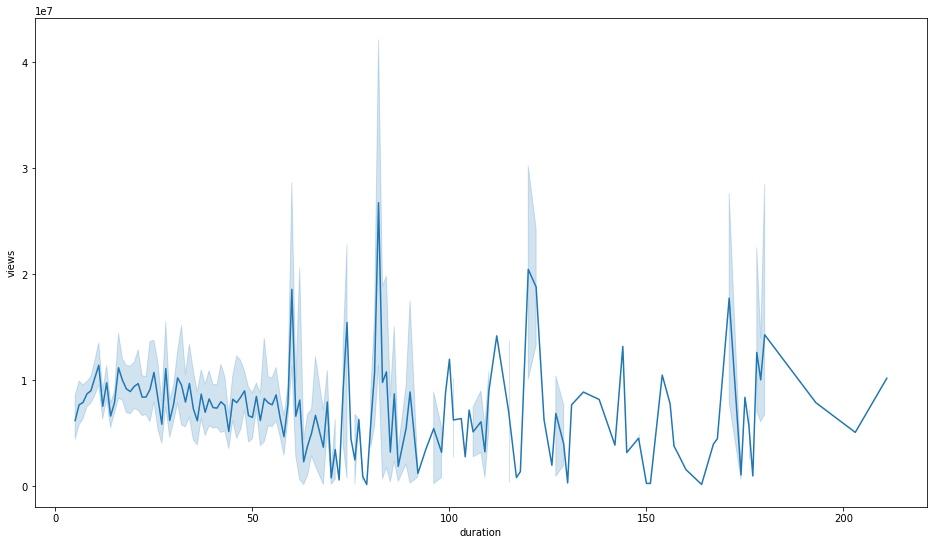

In [38]:
# visualizing duration and like count
plt.figure(figsize = (16,9))
sns.lineplot(x=tiktok[tiktok['category']=='Fitness & Lifestyle'].duration, y=tiktok[tiktok['category']=='Fitness & Lifestyle'].views)

#### ▪️ <span style="color: blue"><b>Comments</b></span>

<AxesSubplot:xlabel='duration', ylabel='comments'>

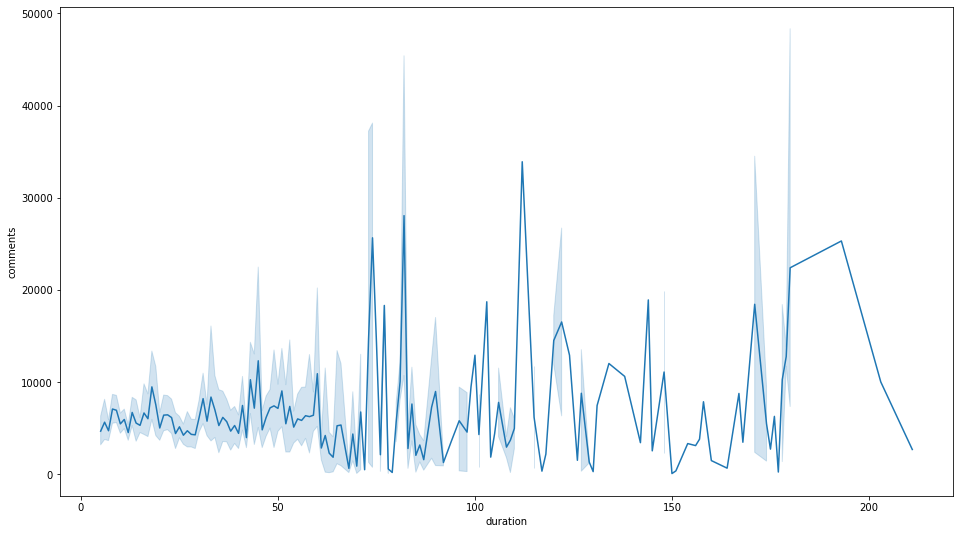

In [39]:
# visualizing duration and like count
plt.figure(figsize = (16,9))
sns.lineplot(x=tiktok[tiktok['category']=='Fitness & Lifestyle'].duration, y=tiktok[tiktok['category']=='Fitness & Lifestyle'].comments)

#### ▪️ <span style="color: blue"><b>Shares</b></span>

<AxesSubplot:xlabel='duration', ylabel='shares'>

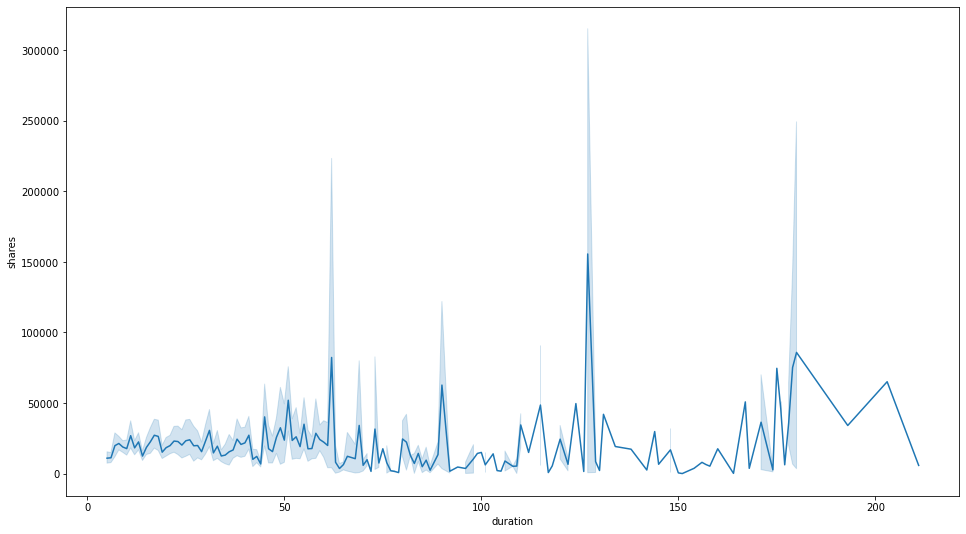

In [40]:
# visualizing duration and like count
plt.figure(figsize = (16,9))
sns.lineplot(x=tiktok[tiktok['category']=='Fitness & Lifestyle'].duration, y=tiktok[tiktok['category']=='Fitness & Lifestyle'].shares)

### <span style='background :orange' >Food</span>

#### ▪️ <span style="color: blue"><b>Likes</b></span>

<AxesSubplot:xlabel='duration', ylabel='likes'>

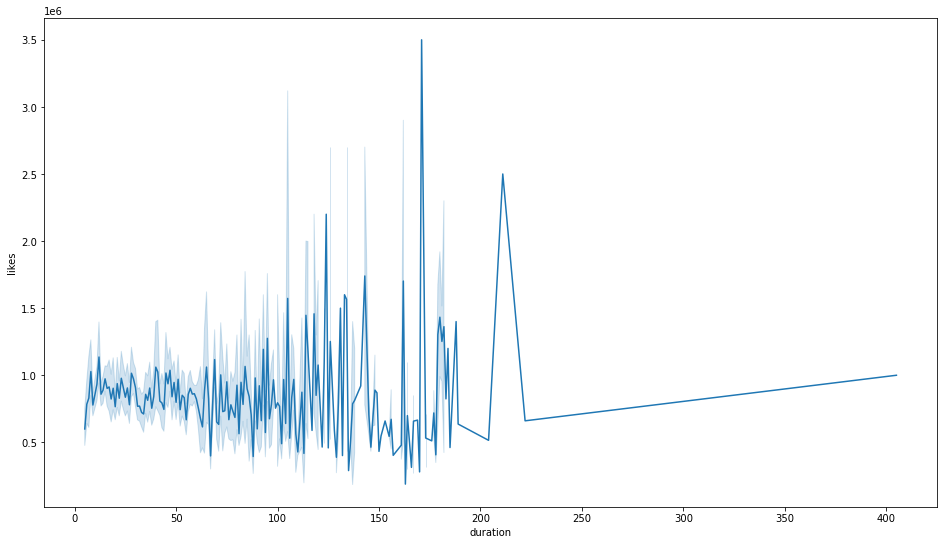

In [41]:
# visualizing duration and like count
plt.figure(figsize = (16,9))
sns.lineplot(x=tiktok[tiktok['category']=='Food'].duration, y=tiktok[tiktok['category']=='Food'].likes)

#### ▪️ <span style="color: blue"><b>Views</b></span>

<AxesSubplot:xlabel='duration', ylabel='views'>

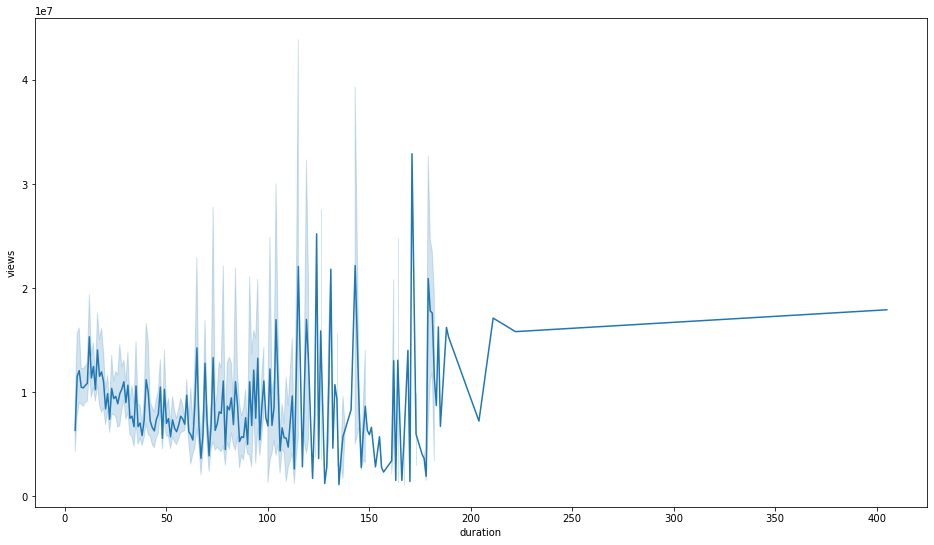

In [42]:
# visualizing duration and like count
plt.figure(figsize = (16,9))
sns.lineplot(x=tiktok[tiktok['category']=='Food'].duration, y=tiktok[tiktok['category']=='Food'].views)

#### ▪️ <span style="color: blue"><b>Comments</b></span>

<AxesSubplot:xlabel='duration', ylabel='comments'>

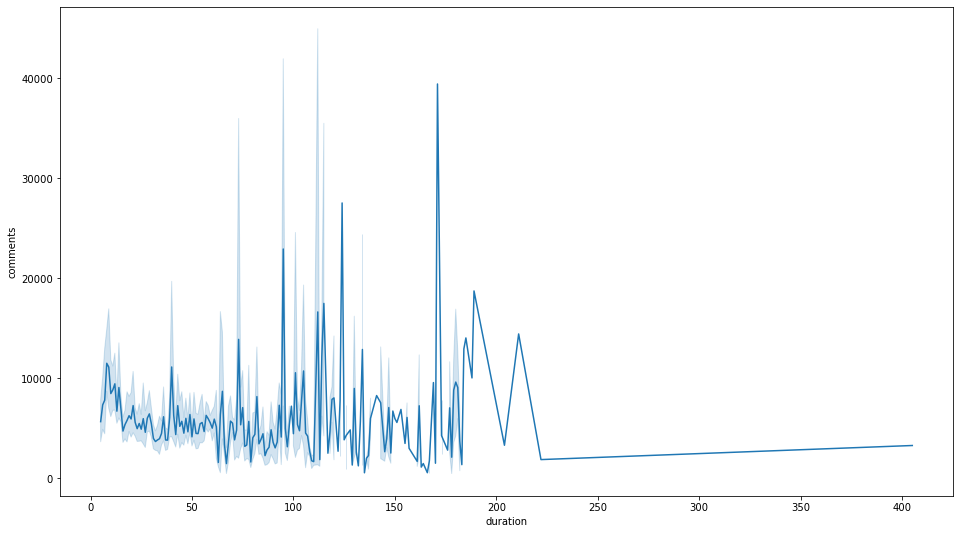

In [43]:
# visualizing duration and like count
plt.figure(figsize = (16,9))
sns.lineplot(x=tiktok[tiktok['category']=='Food'].duration, y=tiktok[tiktok['category']=='Food'].comments)

#### ▪️ <span style="color: blue"><b>Shares</b></span>

<AxesSubplot:xlabel='duration', ylabel='shares'>

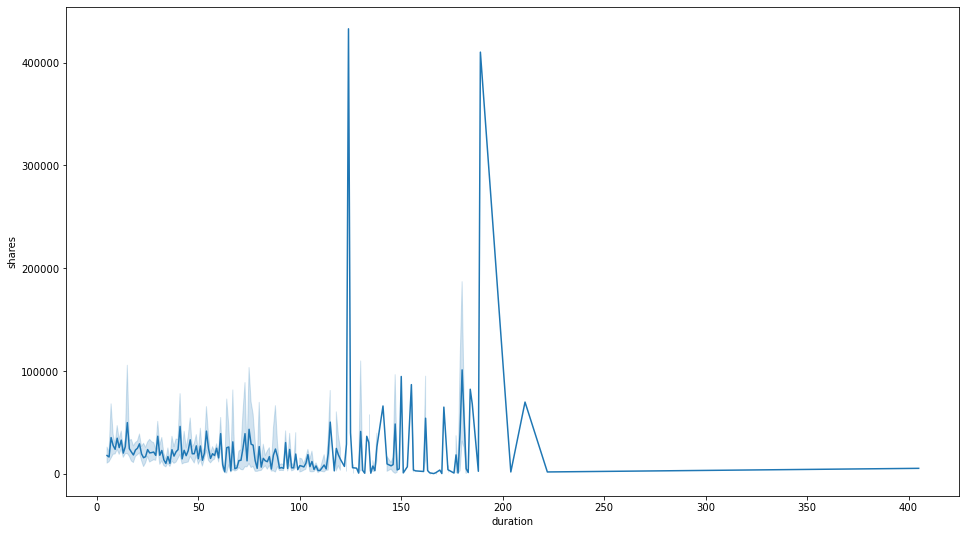

In [44]:
# visualizing duration and like count
plt.figure(figsize = (16,9))
sns.lineplot(x=tiktok[tiktok['category']=='Food'].duration, y=tiktok[tiktok['category']=='Food'].shares)

### <span style='background :orange' >Political Content</span>

#### ▪️ <span style="color: blue"><b>Likes</b></span>

<AxesSubplot:xlabel='duration', ylabel='likes'>

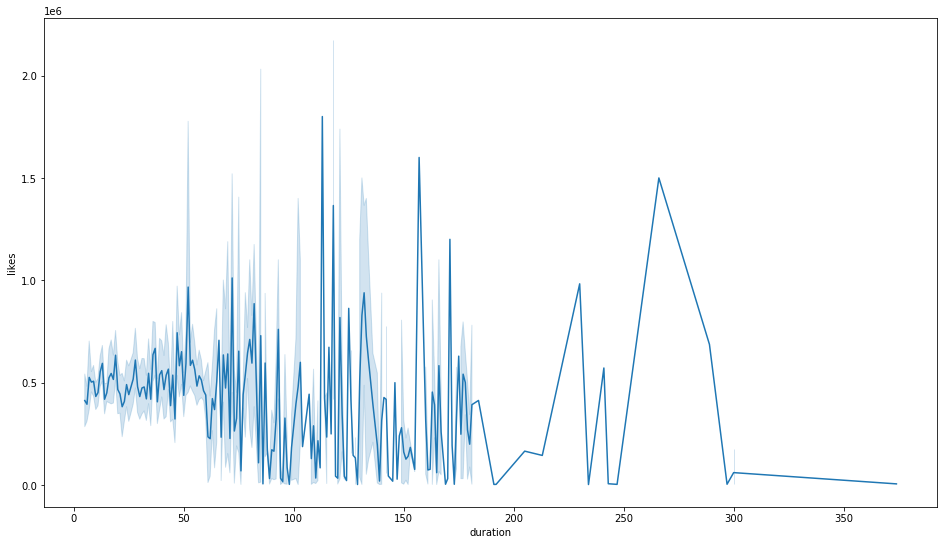

In [46]:
# visualizing duration and like count
plt.figure(figsize = (16,9))
sns.lineplot(x=tiktok[tiktok['category']=='Political'].duration, y=tiktok[tiktok['category']=='Political'].likes)

#### ▪️ <span style="color: blue"><b>Views</b></span>

<AxesSubplot:xlabel='duration', ylabel='views'>

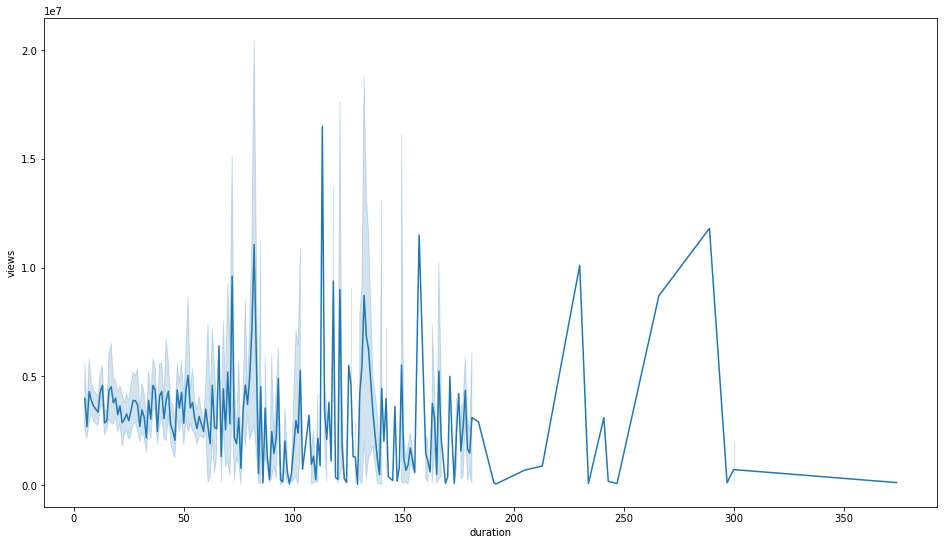

In [47]:
# visualizing duration and like count
plt.figure(figsize = (16,9))
sns.lineplot(x=tiktok[tiktok['category']=='Political'].duration, y=tiktok[tiktok['category']=='Political'].views)

#### ▪️ <span style="color: blue"><b>Comments</b></span>

<AxesSubplot:xlabel='duration', ylabel='comments'>

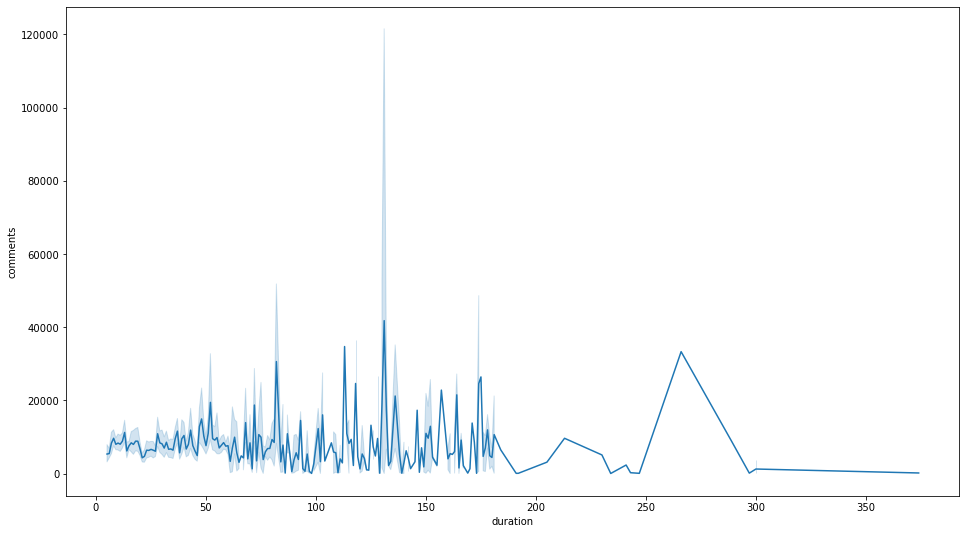

In [48]:
# visualizing duration and like count
plt.figure(figsize = (16,9))
sns.lineplot(x=tiktok[tiktok['category']=='Political'].duration, y=tiktok[tiktok['category']=='Political'].comments)

#### ▪️ <span style="color: blue"><b>Shares</b></span>

<AxesSubplot:xlabel='duration', ylabel='shares'>

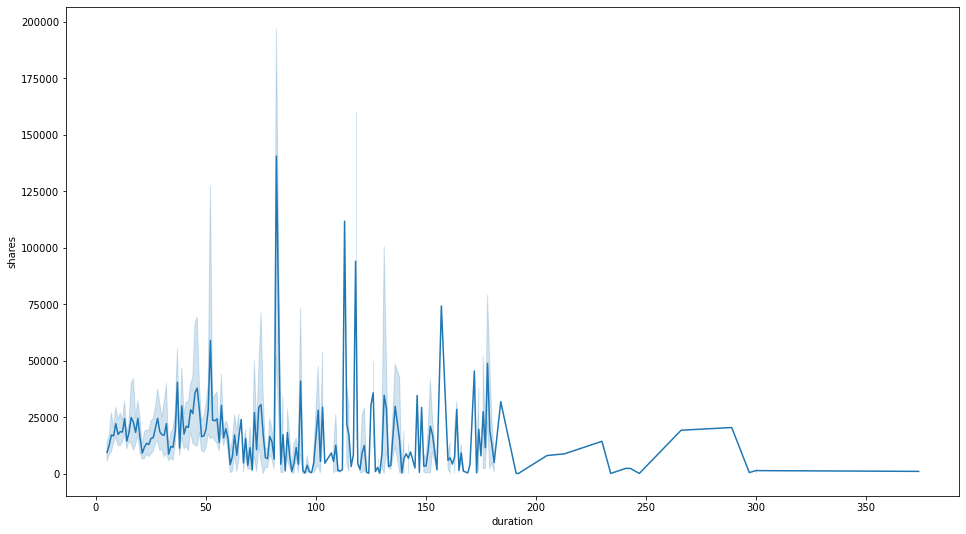

In [49]:
# visualizing duration and like count
plt.figure(figsize = (16,9))
sns.lineplot(x=tiktok[tiktok['category']=='Poltical'].duration, y=tiktok[tiktok['category']=='Political'].shares)

## Engagement vs. Length Category (DASH WIP)

#### Views vs. Duration per Category

<AxesSubplot:xlabel='length', ylabel='views'>

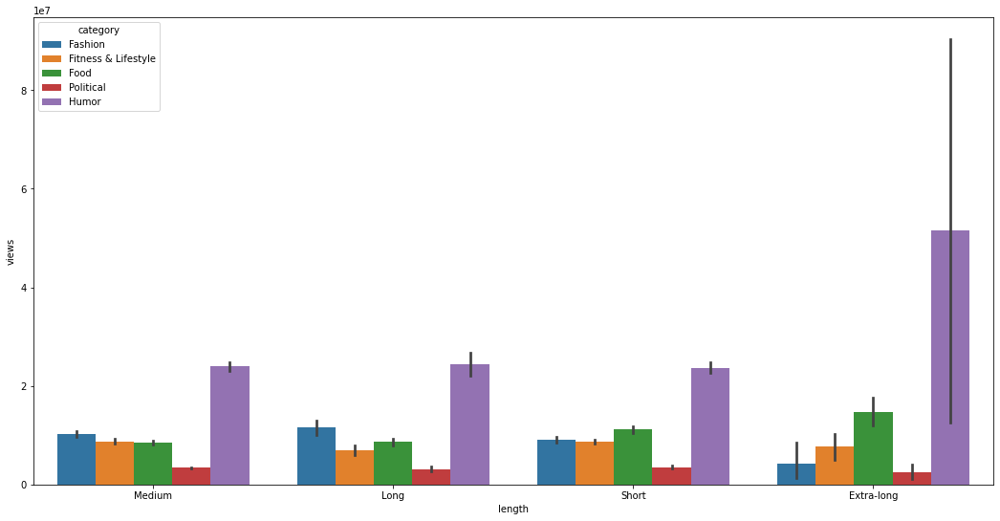

In [67]:
plt.figure(figsize = (18,9))
sns.barplot(x='length', y='views', hue='category', data = tiktok)

<h3><div class="alert alert-info"> Fashion: LONG video has the most view

**Fitness & Lifestyle**: no difference

**Food**: EXTRA-LONG video has the most view

**Humor**: EXTRA-LONG video has the most view</div></h3>

#### Likes vs. Duration per Category

<AxesSubplot:xlabel='length', ylabel='likes'>

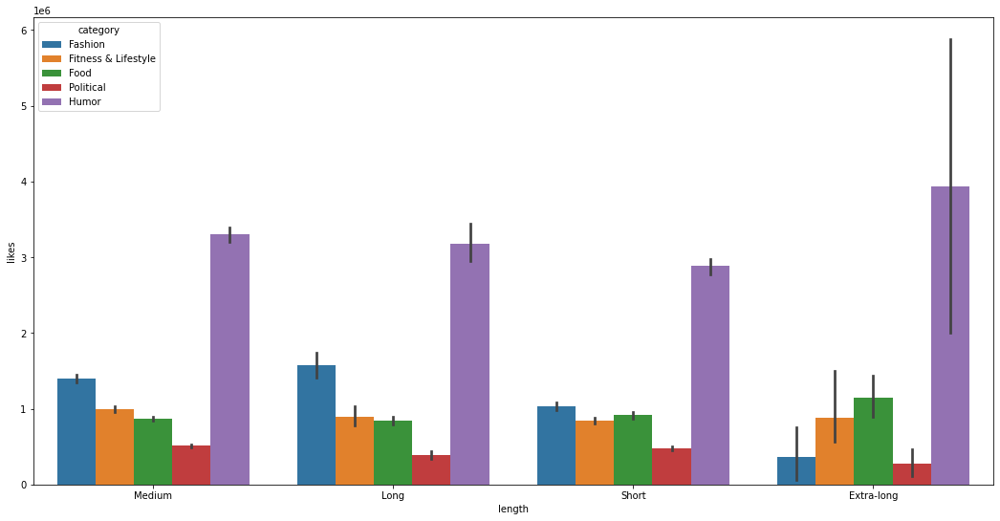

In [68]:
plt.figure(figsize = (18,9))
sns.barplot(x='length', y='likes', hue='category', data = tiktok)

<h3><div class="alert alert-info"> Fashion: LONG video has the most likes

**Fitness & Lifestyle**: no difference (MEDIUM slightly more)

**Food**: EXTRA-LONG video has the most like

**Humor**: EXTRA-LONG video has the most like

#### Comments vs. Duration per Category

In [19]:
tiktok_melt = pd.melt(tiktok, id_vars = ['category', 'length'], value_vars = ['views', 'likes', 'comments', 'shares'])

In [20]:
tiktok_melt

,category,length,variable,value
0,Fashion,Medium: 15-60s,views,46600000
1,Fashion,Medium: 15-60s,views,33200000
2,Fashion,Medium: 15-60s,views,21300000
3,Fashion,Long: 1-3mins,views,35100000
4,Fashion,Medium: 15-60s,views,12900000
...,...,...,...,...
85711,Humor,Medium: 15-60s,shares,59100
85712,Humor,Short: 0-15s,shares,59000
85713,Humor,Medium: 15-60s,shares,960
85714,Humor,Short: 0-15s,shares,9936


In [40]:
data = pd.DataFrame(tiktok.groupby(['category', 'length'])['views'].mean()).reset_index()
data

,category,length,views
0,Fashion,Extra-long: >3mins,4299937.50
1,Fashion,Long: 1-3mins,11621248.43
2,Fashion,Medium: 15-60s,10248673.03
3,Fashion,Short: 0-15s,9171557.10
4,Fitness & Lifestyle,Extra-long: >3mins,7733333.33
5,Fitness & Lifestyle,Long: 1-3mins,7023642.20
6,Fitness & Lifestyle,Medium: 15-60s,8688765.33
7,Fitness & Lifestyle,Short: 0-15s,8703598.12
8,Food,Extra-long: >3mins,14761111.11
9,Food,Long: 1-3mins,8649341.63


In [46]:
fig = px.bar(data, x='length', y='views', color = 'category',
             color_discrete_map={'Fashion':'#6975AB', 'Food': '#3C567F',
                                 'Humor': "#133854", 'Political': '#D7B1FA', 'Fitness & Lifestyle': '#9D93D5'},
             opacity = 1,
             barmode = 'group')
fig.update_layout(paper_bgcolor="#202020", plot_bgcolor='#202020', font_color='#f3e2fe', font_size = 16)
fig.show()

<AxesSubplot:xlabel='length', ylabel='comments'>

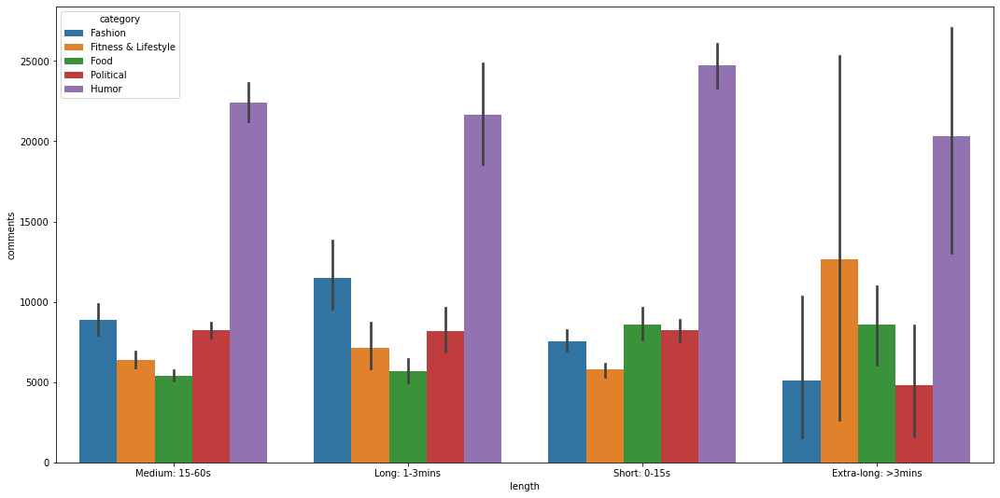

In [11]:
plt.figure(figsize = (18,9))
sns.barplot(x='length', y='comments', hue='category', data = tiktok)

<h3><div class="alert alert-info"> Fashion: LONG video has the most comment
    
**Fitness & Lifestyle**: EXTRA LONG video has the most comment

**Food**: EXTRA-LONG & LONG video has the most commemnt

**Humor**: SHORT video has the most comment</div></h3>

#### Shares vs. Duration per Category

<AxesSubplot:xlabel='length', ylabel='shares'>

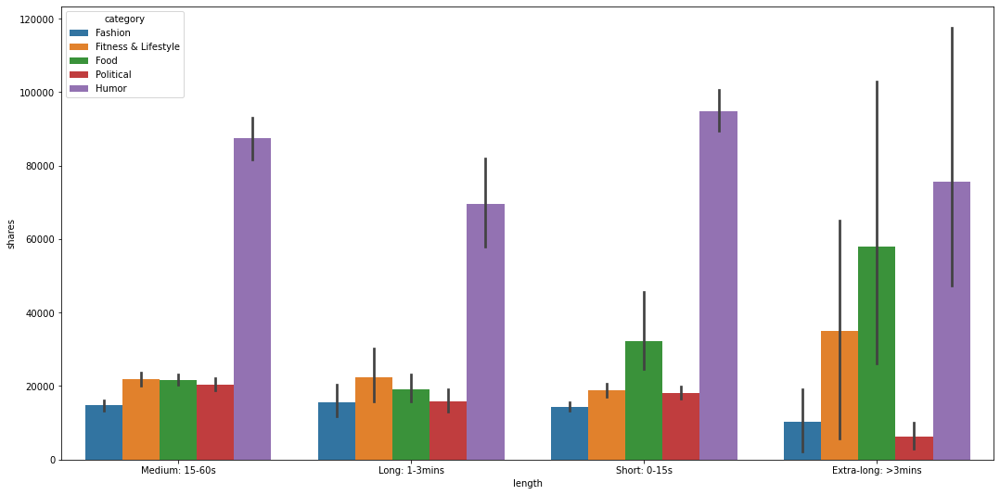

In [12]:
plt.figure(figsize = (18,9))
sns.barplot(x='length', y='shares', hue='category', data = tiktok)

<h3><div class="alert alert-info"> Fashion: no significant difference
    
**Fitness & Lifestyle**: EXTRA LONG video has the most share

**Food**: EXTRA-LONG video has the most share

**Humor**: SHORT video has the most share</div></h3>

***

## Duration vs. categories


In [50]:
tiktok.groupby('category').duration.mean()

category
fashion               29.03
fitness & lifestyle   25.51
food                  39.41
humor                 26.21
political             36.69
Name: duration, dtype: float64

<AxesSubplot:xlabel='category', ylabel='duration'>

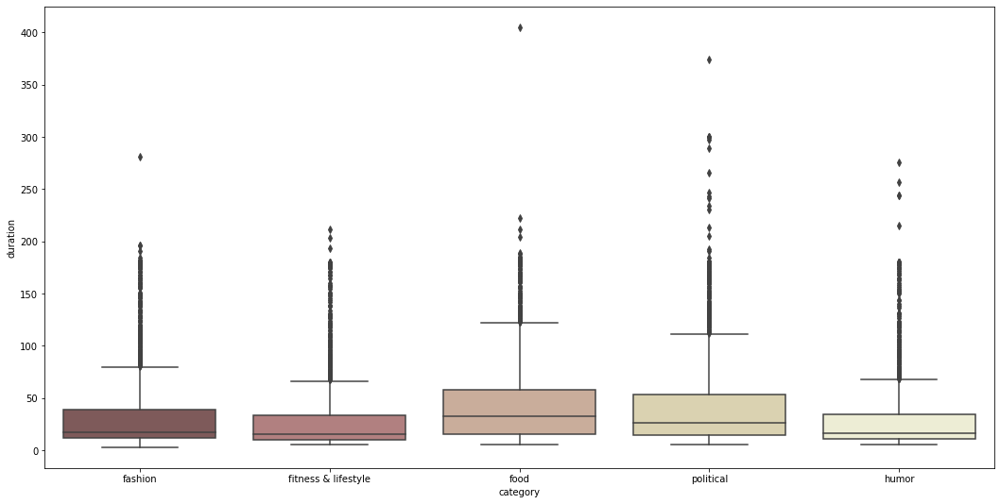

In [56]:
plt.figure(figsize = (18, 9))
sns.boxplot(x=tiktok.category, y=tiktok.duration, palette = 'pink')

#### <h3><div class="alert alert-info">NOTES: Food & Political Content have longer videos than other categories on average.</div></h3>

***

## View vs. Creator's Follower Count

In [49]:
x = tiktok.total_followers
y = tiktok.views
r,p = stats.pearsonr(x, y)

print('p=', p)
print('r=', r)

p= 1.1487717879904175e-218
r= 0.21315169755130853


In [51]:
x = tiktok[tiktok.category =='Fashion'].total_followers
y = tiktok[tiktok.category =='Fashion'].views
r,p = stats.pearsonr(x, y)

print('p=', p)
print('r=', r)

p= 2.4184770167749634e-46
r= 0.21384287595528206


In [53]:
x = tiktok[tiktok.category =='Fitness & Lifestyle'].total_followers
y = tiktok[tiktok.category =='Fitness & Lifestyle'].views
r,p = stats.pearsonr(x, y)

print('p=', p)
print('r=', r)

p= 1.0065263299718195e-16
r= 0.13017873620268905


In [54]:
x = tiktok[tiktok.category =='Humor'].total_followers
y = tiktok[tiktok.category =='Humor'].views
r,p = stats.pearsonr(x, y)

print('p=', p)
print('r=', r)

p= 7.4576439062385e-59
r= 0.23742979401870687


In [55]:
x = tiktok[tiktok.category =='Food'].total_followers
y = tiktok[tiktok.category =='Food'].views
r,p = stats.pearsonr(x, y)

print('p=', p)
print('r=', r)

p= 5.458043995641838e-06
r= 0.06781961577072612


In [56]:
x = tiktok[tiktok.category =='Political'].total_followers
y = tiktok[tiktok.category =='Political'].views
r,p = stats.pearsonr(x, y)

print('p=', p)
print('r=', r)

p= 1.029018405633828e-47
r= 0.22578294915155905


#### Humor content view has the strongest correlation with creator's follower size.
#### Food content view has the weakest correlation with creator's follower size.

## Like vs. Creator's Follower Count

In [58]:
x = tiktok.total_followers
y = tiktok.likes
r,p = stats.pearsonr(x, y)

print('p=', p)
print('r=', r)

p= 1.4099937374698686e-265
r= 0.23452311951914895


In [59]:
x = tiktok[tiktok.category =='Fashion'].total_followers
y = tiktok[tiktok.category =='Fashion'].likes
r,p = stats.pearsonr(x, y)

print('p=', p)
print('r=', r)

p= 2.5954737527858805e-84
r= 0.2882280595913827


In [60]:
x = tiktok[tiktok.category =='Fitness & Lifestyle'].total_followers
y = tiktok[tiktok.category =='Fitness & Lifestyle'].likes
r,p = stats.pearsonr(x, y)

print('p=', p)
print('r=', r)

p= 2.3375519304187736e-21
r= 0.14855830518404659


In [61]:
x = tiktok[tiktok.category =='Humor'].total_followers
y = tiktok[tiktok.category =='Humor'].likes
r,p = stats.pearsonr(x, y)

print('p=', p)
print('r=', r)

p= 2.938280844765599e-58
r= 0.2362225027395874


In [63]:
x = tiktok[tiktok.category =='Food'].total_followers
y = tiktok[tiktok.category =='Food'].likes
r,p = stats.pearsonr(x, y)

print('p=', p)
print('r=', r)

p= 2.623779671849962e-56
r= 0.2328723813951854


In [64]:
x = tiktok[tiktok.category =='Political'].total_followers
y = tiktok[tiktok.category =='Political'].likes
r,p = stats.pearsonr(x, y)

print('p=', p)
print('r=', r)

p= 4.0219782843551476e-45
r= 0.21948249349047205


#### Fashion content like has the strongest correlation with creator's follower size.
#### Fitness & Lifestyle content view has the weakest correlation with creator's follower size.

In [72]:
px.scatter(tiktok, x='total_followers', y='likes', color = 'category')

## Comment vs. Creator's Follower Count

In [65]:
x = tiktok.total_followers
y = tiktok.comments
r,p = stats.pearsonr(x, y)

print('p=', p)
print('r=', r)

p= 1.8257064676340625e-25
r= 0.07115757563494168


## Share vs. Creator's Follower Count

In [66]:
x = tiktok.total_followers
y = tiktok.shares
r,p = stats.pearsonr(x, y)

print('p=', p)
print('r=', r)

p= 8.788175184763396e-21
r= 0.06380872634561635


In [69]:
tiktok['engagement'] = tiktok['likes']+tiktok['comments']+tiktok['shares']

In [68]:
tiktok.dtypes

comments                    int64
likes                       int64
views                       int64
shares                      int64
total_followers             int64
total_likes                 int64
total_videos                int64
description                object
duration                    int64
hashtag                    object
category                   object
date               datetime64[ns]
length                     object
dtype: object

## Total Engagement vs. Creator's Follower Count

In [70]:
x = tiktok.total_followers
y = tiktok.engagement
r,p = stats.pearsonr(x, y)

print('p=', p)
print('r=', r)

p= 1.1868696955287739e-256
r= 0.23062546127015834


***

## TikTok Engagement Over Time

In [91]:
df = pd.read_csv('tiktok_data.csv')
df = prepare.prep_tiktok(df)
df.set_index('date', inplace=True)
df = df.sort_index()

In [92]:
# trim off date range
df = df[df.index>='2018-12-01']
df = df[df.index<='2022-09-10']

In [93]:
# resample on week
resample = df.resample('w')[['comments', 'likes', 'views', 'shares']].sum()

In [ ]:
#D2DAFF

In [94]:
fig = px.line(resample, x=resample.index, y='views', color_discrete_sequence=['#E80F88'])
fig.add_vrect(x0='2020-02-01', x1="2020-04-28", annotation_text = 'COVID-19 Outbreak', annotation_position='top right', fillcolor="#72FFFF", opacity = 0.25)
fig.add_vrect(x0='2019-03-15', x1="2019-06-22", annotation_text = 'Hong Kong Protest', annotation_position='bottom right', fillcolor="#CFFFDC", opacity = 0.25)
fig.add_vrect(x0="2020-05-24", x1='2020-08-13', annotation_text='George Floyd Protests', annotation_position='bottom left', fillcolor = '#FFF9CA', opacity=0.25)
fig.add_vrect(x0="2020-12-13", x1='2020-12-14', annotation_text='Election Day', annotation_position='top right', fillcolor = '#FFF9CA', opacity=0.8)
fig.add_vrect(x0="2021-05-09", x1='2021-05-10', annotation_text='Afghanistan Bombing', annotation_position='bottom left', fillcolor = '#FFF9CA', opacity=0.8)
# fig.add_vrect(x0="2021-07-29", x1='2021-07-29', annotation_text='Biden Vaccine Mandate', annotation_position='top left', fillcolor = '#FFF9CA', opacity=0.8)
fig.add_hline(y=11237882, annotation_text = 'AVG', annotation_position = 'top left')

fig.update_layout(paper_bgcolor="#202020", plot_bgcolor='#202020', font_color='#f3e2fe', font_size = 16, height = 500)

**2019 Engagement**

In [111]:
resample[(resample.index>='2019-01-01') & (resample.index<='2019-12-31')].describe()

,comments,likes,views,shares
count,52.00,52.00,52.00,52.00
mean,76088.44,18941344.69,210299325.12,720228.88
std,75926.61,19980858.79,207454646.85,771571.50
min,125.00,176200.00,3600000.00,454.00
25%,17000.00,4855150.00,59120125.00,122842.75
50%,56304.50,10639283.00,135986803.00,441787.00
75%,106273.25,26826175.00,272611625.00,945104.00
max,340686.00,66192100.00,875555400.00,2916363.00


**2020 Engagement**

In [107]:
resample[(resample.index>='2020-01-01') & (resample.index<='2020-12-31')].describe()

,comments,likes,views,shares
count,52.00,52.00,52.00,52.00
mean,1029539.02,134840874.73,1072824745.50,3999112.77
std,624917.03,48638251.14,282258621.92,1789729.65
min,167171.00,60042301.00,615742900.00,1925487.00
25%,561346.25,99226005.75,895963900.00,2816616.50
50%,916700.00,123079221.00,1045190100.00,3471547.50
75%,1295384.50,159335419.75,1202445875.00,4771601.50
max,3351754.00,290126431.00,1834715400.00,11019149.00


**2021 Engagement**

In [109]:
resample[(resample.index>='2021-01-01') & (resample.index<='2021-12-31')].describe()

,comments,likes,views,shares
count,52.00,52.00,52.00,52.00
mean,1997133.65,222254914.02,1730053759.62,5755760.02
std,504371.44,36450980.77,310509609.31,1265674.82
min,1168227.00,117031459.00,926024400.00,3205320.00
25%,1556341.00,197591826.00,1522793875.00,5105952.75
50%,1941381.00,222463585.50,1724618900.00,5810131.00
75%,2427453.25,248058046.25,1937053300.00,6506910.00
max,3084024.00,305520869.00,2489662900.00,8761080.00


**2022 Engagement**

In [110]:
resample[(resample.index>='2022-01-01') & (resample.index<='2022-12-31')].describe()

,comments,likes,views,shares
count,37.00,37.00,37.00,37.00
mean,1816925.35,254604296.35,2271657764.86,5240857.46
std,445645.75,53324535.00,545676063.77,1602054.45
min,737654.00,111279769.00,846219800.00,1967877.00
25%,1566195.00,223069926.00,1971279900.00,4427294.00
50%,1841571.00,259344703.00,2283792200.00,5133230.00
75%,2050846.00,294586454.00,2654041200.00,5630862.00
max,2941710.00,368688302.00,3302160200.00,10772028.00


In [112]:
(2271657764.86-210299325.12)/210299325.12

9.802021183680726

***

# YouTube

- `df_yt` index is date (time series)
- `youtube` index is not date (univariate & bivariate)

In [145]:
youtube = pd.read_csv('youtube_data.csv')
youtube = prepare.prep_youtube(youtube)

In [131]:
df_yt = pd.read_csv('youtube_data.csv')

In [132]:
df_yt = prepare.prep_youtube(df_yt)

In [133]:
df_yt.head()

,title,pub_date,duration,viewCount,hashtag,category,hour,minute,second,length(second)
0,The Truth Behind The Global Pandemic. Jordan M...,2022-09-16,00:26:40,48882,comedy,humor,0,26,40,1600
1,The Best Comedy Special Ever. Gabriel Rutledge...,2022-08-16,00:25:24,621694,comedy,humor,0,25,24,1524
2,Look At These Assholes: Trump Family Edition |...,2022-07-17,00:05:45,2248400,comedy,humor,0,5,45,345
3,More Than Funny Comedy Special | Michael Jr. #...,2021-10-15,01:23:38,1813052,comedy,humor,1,23,38,5018
4,2020 FUNNY COMEDY BEST OF MARVELOUS SARAH PRIN...,2021-09-16,00:28:51,21036895,comedy,humor,0,28,51,1731


In [134]:
df_yt.shape

(15677, 10)

In [135]:
df_yt = df_yt[df_yt.pub_date >= '2018-12-31']

In [136]:
df_yt = df_yt.set_index('pub_date')

In [137]:
df_yt = df_yt.sort_index()

In [138]:
df_yt.head()

,title,duration,viewCount,hashtag,category,hour,minute,second,length(second)
pub_date,,,,,,,,,
2019-09-17,Best Outfit Tutorial - Outfit Of The 1 Compila...,00:13:09,72248,ootd,fashion,0,13,9,789
2019-09-17,#JeetFix: Hard Workout Motivational Video for ...,00:04:52,7786902,motivation,fitness & lifestyle,0,4,52,292
2019-09-17,LONG HAIR STRUGGLES || GIRLS PROBLEMS || Relat...,00:03:26,35510979,fun,humor,0,3,26,206
2019-09-17,Ariana Maistrov (SIS N BRO) - LOL,00:03:08,4085423,lol,humor,0,3,8,188
2019-09-17,CLOSET TOUR - Expectations vs Reality | Behind...,00:09:44,18520265,fun,humor,0,9,44,584


In [139]:
# resample on week
resample = df_yt.resample('w')[['viewCount']].sum()

In [140]:
fig = px.line(resample, x=resample.index, y='viewCount', color_discrete_sequence=['#E80F88'])
fig.add_vline(x="2020-03-10", line_width=3, line_dash="dash", line_color="#D2DAFF")
fig.add_vline(x="2019-10-27", line_width=3, line_dash="dash", line_color="#D2DAFF")
fig.update_layout(paper_bgcolor="#202020", plot_bgcolor='#202020', font_color='#f3e2fe', font_size = 16, height = 500)

## Univariate Analysis - YouTube Video Length

In [146]:
youtube.head()

,title,pub_date,duration,viewCount,hashtag,category,hour,minute,second,length(second)
0,The Truth Behind The Global Pandemic. Jordan M...,2022-09-16,00:26:40,48882,comedy,humor,0,26,40,1600
1,The Best Comedy Special Ever. Gabriel Rutledge...,2022-08-16,00:25:24,621694,comedy,humor,0,25,24,1524
2,Look At These Assholes: Trump Family Edition |...,2022-07-17,00:05:45,2248400,comedy,humor,0,5,45,345
3,More Than Funny Comedy Special | Michael Jr. #...,2021-10-15,01:23:38,1813052,comedy,humor,1,23,38,5018
4,2020 FUNNY COMEDY BEST OF MARVELOUS SARAH PRIN...,2021-09-16,00:28:51,21036895,comedy,humor,0,28,51,1731


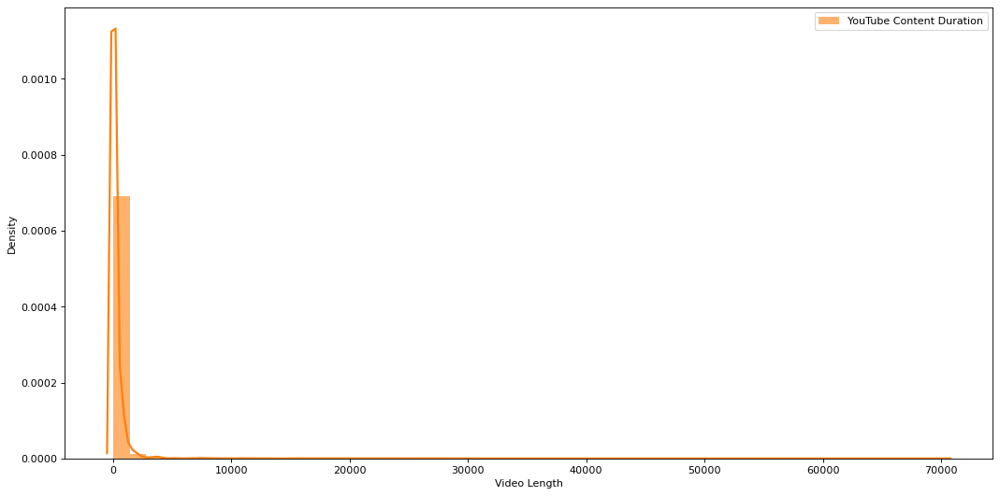

In [147]:
# duration distribution
kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
plt.figure(figsize=(16,8), dpi= 80)
sns.distplot(youtube['length(second)'], color="#ff800e", label="YouTube Content Duration", **kwargs)
plt.xlabel('Video Length')
plt.ylabel('Density')
plt.legend()

Text(0, 0.5, 'Density')

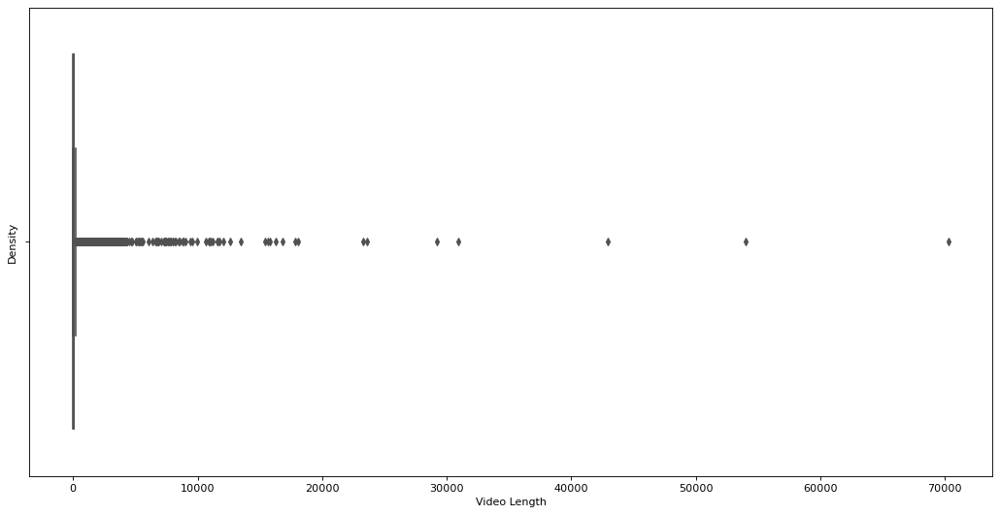

In [150]:
# duration distribution
plt.figure(figsize=(16,8), dpi= 80)
sns.boxplot(youtube['length(second)'], color="#ff800e")
plt.xlabel('Video Length')
plt.ylabel('Density')

**NOTE: Too much outliers, and we need to focus on only the subset of the data to compare with TikTok.**

In [151]:
youtube['length(second)'].describe()

count   15677.00
mean      242.46
std      1149.22
min         2.00
25%        14.00
50%        29.00
75%        93.00
max     70308.00
Name: length(second), dtype: float64

In [176]:
youtube.shape

(15677, 10)

In [152]:
iqr = 93-14

In [161]:
# using iqr range to determind bound
upper = 10*iqr + 93
upper

883

In [162]:
# testing upper bound
youtube[youtube['length(second)']>883].shape

(924, 10)

In [177]:
# this is more reasonable size and more aligned with TikTok video duration
youtube[youtube['length(second)']<=200].shape

(12192, 10)

#### DataFrame `short` for YouTube Shorts

In [2]:
# test function for youtube shorts
short = pd.read_csv('youtube_data.csv')

In [3]:
short = prepare.prep_ytshort(short)

In [4]:
short['length(second)'].max()

200

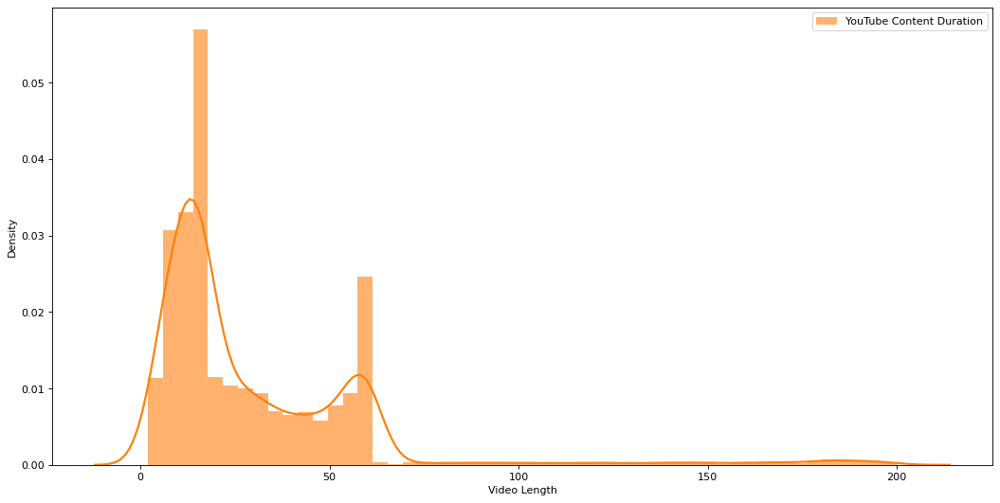

In [5]:
# duration distribution
kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
plt.figure(figsize=(16,8), dpi= 80)
sns.distplot(short['length(second)'], color="#ff800e", label="YouTube Content Duration", **kwargs)
plt.xlabel('Video Length')
plt.ylabel('Density')
plt.legend()

In [9]:
# visualizing duration distribution
fig = px.histogram(short, x='length', title='YouTube Video Content Duration', template = "plotly_dark",
                   color='length', color_discrete_sequence=['#133854', '#9d93d5','#6975ab', '#edd2fe'],
                  labels={
                      'length':'Video Duration', 'count':'Amount of Videos'
                      
                  })
fig.update_xaxes(categoryorder='array', categoryarray=['Medium', 'Short', 'Long', 'Extra-long'])
fig.update_layout(paper_bgcolor="#202020", plot_bgcolor='#202020', font_color='#f3e2fe')
fig.show()

#### NOTE: YouTube content duration follow similar pattern with TikTok

## View Count

In [19]:
tiktok.views.describe()

count       21429.00
mean     11237882.48
std      15332275.17
min          4906.00
25%       2200000.00
50%       6100000.00
75%      14200000.00
max     262600000.00
Name: views, dtype: float64

In [6]:
short.viewCount.describe()

count       12192.00
mean      1790364.17
std      10667643.29
min             1.00
25%          1252.75
50%          4571.00
75%         88188.75
max     343531413.00
Name: viewCount, dtype: float64

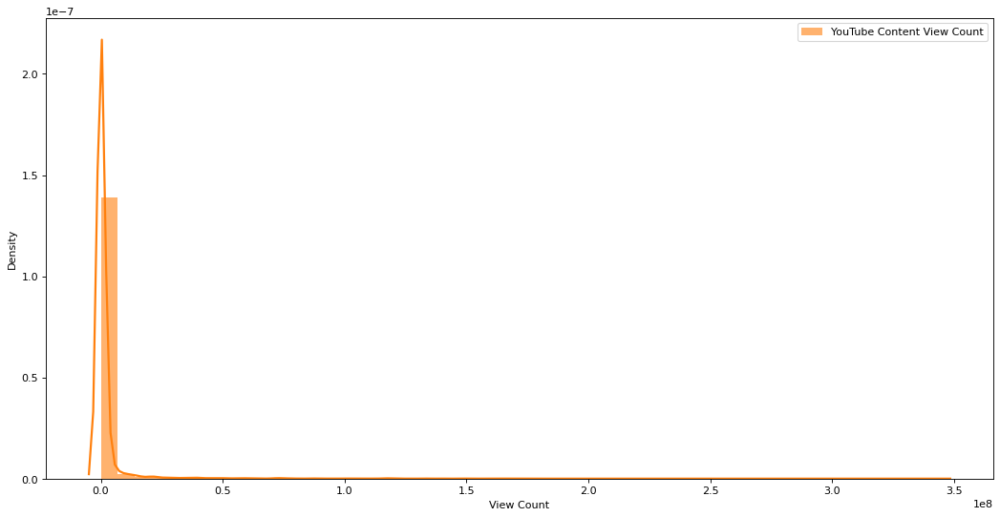

In [8]:
# duration distribution
kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
plt.figure(figsize=(16,8), dpi= 80)
sns.distplot(short['viewCount'], color="#ff800e", label="YouTube Content View Count", **kwargs)
plt.xlabel('View Count')
plt.ylabel('Density')
plt.legend()

## View Count per Category

In [10]:
short.head()

,title,pub_date,duration,viewCount,hashtag,category,hour,minute,second,length(second),length
17,When A Dog Is At The Party üê∂ ft AdamW #shor...,2022-07-22,00:00:59,6146898,comedy,humor,0,0,59,59,Medium: 15-60s
19,Best Mentos And Cola Prank.. #cola #pranks #fu...,2022-09-16,00:00:30,7099,comedy,humor,0,0,30,30,Medium: 15-60s
21,Waiting For Girlfriend To Pick an Outfit... ü...,2022-05-17,00:01:01,28139472,comedy,humor,0,1,1,61,Long: 1-3mins
29,She kept switching my candy üò±ü•∫ #comedy #...,2022-08-16,00:00:22,35744908,comedy,humor,0,0,22,22,Medium: 15-60s
30,Movie dikhaane jaa raha tha lekin.. üçø üé• ...,2022-09-16,00:00:23,7546,comedy,humor,0,0,23,23,Medium: 15-60s


In [11]:
short.groupby('category').viewCount.describe()

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
fashion,3331.00,1081036.86,7322025.24,1.00,584.00,3067.00,49215.50,235826634.00
fitness & lifestyle,800.00,3956805.00,15744223.24,2.00,1807.00,8726.00,592947.50,162976789.00
food,4509.00,398255.63,3285054.28,1.00,1233.00,2747.00,10075.00,100488196.00
humor,3552.00,3734799.43,16222259.36,1.00,2442.00,32441.50,555569.75,343531413.00


In [16]:
tiktok.groupby('category').views.describe()

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
Fashion,4367.00,9805319.35,12851088.28,35200.00,1100000.00,6500000.00,13700000.00,218100000.00
Fitness & Lifestyle,4037.00,8624124.37,10333725.70,27200.00,1900000.00,5700000.00,11500000.00,178100000.00
Food,4486.00,9252587.54,9615257.25,571100.00,3600000.00,6200000.00,11200000.00,125300000.00
Humor,4512.00,23923460.55,22953141.93,70100.00,8300000.00,18300000.00,32400000.00,262600000.00
Political,4027.00,3409834.19,4076190.98,4906.00,892850.00,2200000.00,4400000.00,47000000.00


## 3 Platforms Engagement Comparison

In [73]:
stats = pd.DataFrame({'Trending Content Avg. Engagement': [11237882,1790364,10414], 'Platform': ['TikTok', 'YouTube', 'Instagram']})
fig = px.bar(stats, x='Platform', y='Trending Content Avg. Engagement', color = 'Platform', color_discrete_map={'YouTube':'#dfaeff', 'TikTok': '#3C567F',
                                                                                                    'Instagram': "#f3e2fe"})
fig.update_layout(paper_bgcolor="#202020", plot_bgcolor='#202020', font_color='#f3e2fe', font_size = 14, height = 500)

In [75]:
tiktok.views.describe()

count       21429.00
mean     11237882.48
std      15332275.17
min          4906.00
25%       2200000.00
50%       6100000.00
75%      14200000.00
max     262600000.00
Name: views, dtype: float64

In [99]:
test = pd.read_csv('tiktok_data.csv')

In [101]:
test.head()

,commentCount,diggCount,playCount,shareCount,followerCount,heartCount,videoCount,description,duration,time,hashtag,category
0,33000,5100000,46600000,16400,2800000,58800000,318,Can you count how many layers are in this dres...,40,1626635893,fashion,fashion
1,0,5100000,33200000,21900,163500,10700000,451,it had to be done ‚ùå #SmellLikeIrishSpring #O...,59,1648504875,fashion,fashion
2,54600,5000000,21300000,17100,3800000,81900000,510,Reply to @wibowowowo_17 NGL this was tougher t...,17,1594775651,fashion,fashion
3,18300,5000000,35100000,27300,6500000,120900000,458,al principio pens√© que se equivocaron de paqu...,75,1655771466,fashion,fashion
4,15100,4900000,12900000,9574,241800,8500000,72,I love this outfit so much #fashion #fashionti...,42,1642621639,fashion,fashion
